In [1]:

import jax
import os



os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '1.0'
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
print(jax.local_devices())



import jax
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random, vmap, jit, grad
import jax.scipy as scipy

from jax import random


import matplotlib.pyplot as plt

from utils_rough_pde import *
from utils_elliptic_coef import *

from scipy import integrate

import time

from jax.numpy import fft

from tqdm import tqdm

import math

from jax import grad

from scipy import integrate

[cuda(id=0)]


In [2]:
from jax import jit, grad, vmap, hessian, value_and_grad
import optax

In [3]:
#plt.style.use('default')
plt.style.use('plot_style-Examples_3d.txt')

# 16:9 aspect ratio
width = 4
height = width * 3 / 4

In [4]:
def discrete_sine_transform(y):
    """
    y is the vector of coefficents of size n. It assumes that it only contains the frequencies 1,2,3,...,n. (no zero frequency)
    returns evaluation of the sine series at the points 1,2,3,...,n (no zero point)
    """
    n = y.shape[0]
    y_extended = jnp.concatenate([jnp.zeros(1), y, jnp.zeros(1), -y[::-1]])
    y_fft = jnp.fft.fft(y_extended)/2
    return (-y_fft.imag)[1: n+1]*jnp.sqrt(2)

vmap_dst = jit(vmap(discrete_sine_transform, in_axes=(0,)))
@jit
def dst_2d(A):
    # Receives a 2d array and returns the 2d discrete sine transform
    return vmap_dst(vmap_dst(A).T).T


@jit
def compute_sine_coef_2d(A):
    # Receives a 2d array and returns the coefficients Fourier space of the sine series by using the DST
    n = A.shape[0]
    return dst_2d(A)/((n+1)**2)

vmap_compute_sine_coef = jit(vmap(compute_sine_coef_2d, in_axes = 0))


def compute_2d_error(pred, u, x, y):
    norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u**2, x), y))
    norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred - u)**2, x), y))
    return norm_diff, norm_diff/norm_u

def create_interior(x, y):
    # Use meshgrid to create the grid of pairs
    A, B = jnp.meshgrid(x, y, indexing='ij')

    # Combine A and B into pairs
    interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
    return interior

In [5]:
# Define the neural network
def init_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        weights = random.normal(key, (m, n)) * jnp.sqrt(2 / m)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_normal_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        stddev = jnp.sqrt(2.0 / (m + n))
        weights = stddev * random.normal(key, (m, n))
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        glorot_scale = jnp.sqrt(6.0 / (m + n))
        weights = random.uniform(key, (m, n), minval=-glorot_scale, maxval=glorot_scale)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params


def predict(params, x):
    activations = x
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [6]:
def count_parameters(params):
    total_params = 0
    for weights, biases in params:
        total_params += weights.size
        total_params += biases.size
    return total_params

# Semilinear example


We will consider the problem 

\begin{aligned}
 -\nu \Delta u + bu+c \sin(\beta 2\pi u) &= \xi \quad x \in \Omega\\
u &= 0 \quad x \in \partial \Omega
\end{aligned}

with a manufactured solution 


\begin{aligned}
u = \sum_{k=1}^\infty\sum_{l=1}^\infty \frac{u_{kl}}{(k^2 + l^2)^{\alpha + \delta}} \sin(\pi k x) \sin(\pi l y) \quad  u_{kl} \sim \mathcal{N}(0, 1)
\end{aligned}


In [7]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])

In [8]:
key = random.PRNGKey(647023)

c = 1.0
beta = 0.5

n_coef = 2**10
print("Number of coefficients: {} ({} toal)".format(n_coef, n_coef**2))

nu = 1e-1
b = jit(lambda x, y:1)#jit(lambda x, y: jnp.cos(5*jnp.pi*(x**2 + y**4)) + x**2 + jnp.exp(-y**2)+ 1.5)
vmap_b = jit(vmap(vmap(b, in_axes = (None, 0)), in_axes = (0, None)))


x_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:] # make sure to exclude the points 0 and 1!
y_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x_finest, y_finest)
A, B = jnp.meshgrid(x_finest, y_finest, indexing='ij')
interior_finest = jnp.stack((A, B), axis=-1).reshape(-1, 2)



frequencies = jnp.arange(0, n_coef) + 1

delta = 0.025
alpha = 1.0
random_draw =  random.normal(key, shape= (n_coef,n_coef))


decay = (jnp.arange(1,n_coef + 1)[None]**2 + jnp.arange(1,n_coef+1)[:,None]**2)
coef_u =random_draw*(decay)**(-alpha -delta)
coef_laplacian =coef_u*((nu*jnp.pi**2*decay))


Number of coefficients: 1024 (1048576 toal)


In [9]:
s = 1 -2*delta # Where the right hand side lives (not included). The limit is H^{-1}
s

0.95

In [10]:
tau = jit(lambda x: c*jnp.sin(beta*2*jnp.pi*x))
tau_prime = jit(lambda x: c*jnp.cos(beta*2*jnp.pi*x)*beta*2*jnp.pi)

In [11]:
u_values = dst_2d(coef_u)
f_values = dst_2d(coef_laplacian) + vmap_b(x_finest, y_finest)*u_values + tau(u_values)

In [12]:
coef_f = compute_sine_coef_2d(f_values)
print(jnp.mean(jnp.abs(coef_u - compute_sine_coef_2d(u_values))))

1.6026921844310666e-19


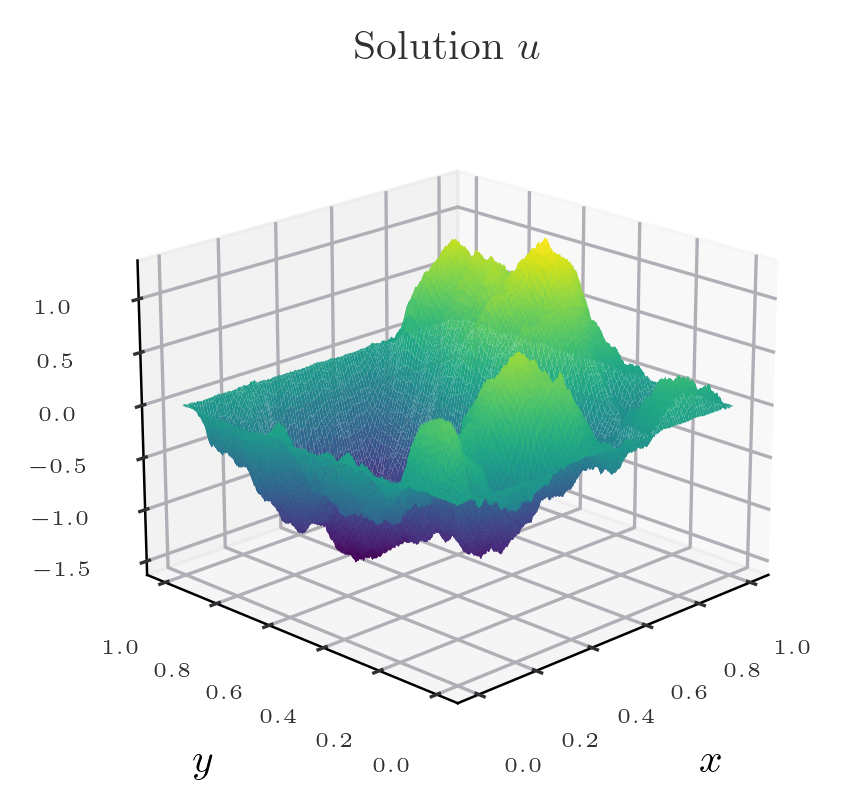

In [13]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 10
ax.plot_surface(X, Y, u_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Solution $u$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

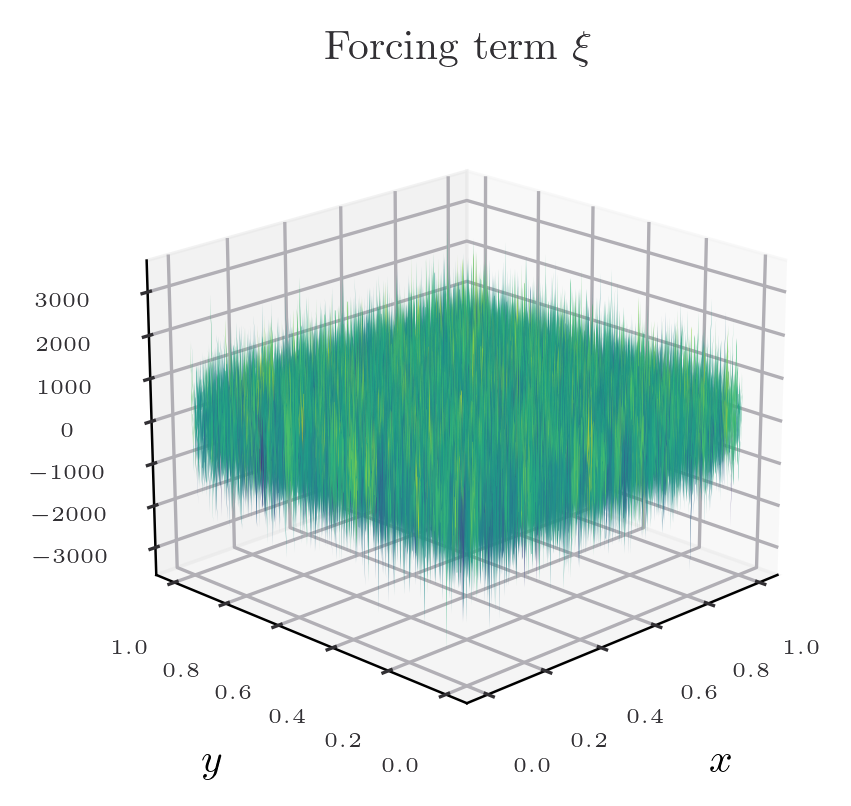

In [14]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, f_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Forcing term $\xi$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

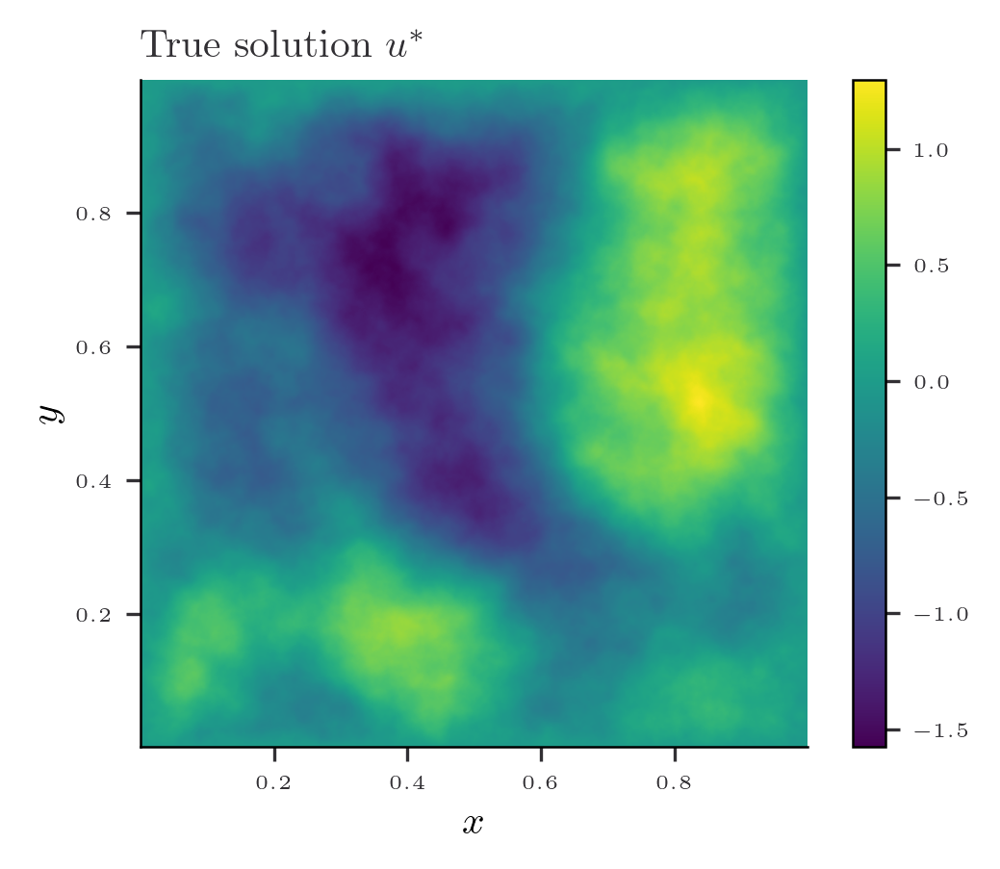

In [15]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

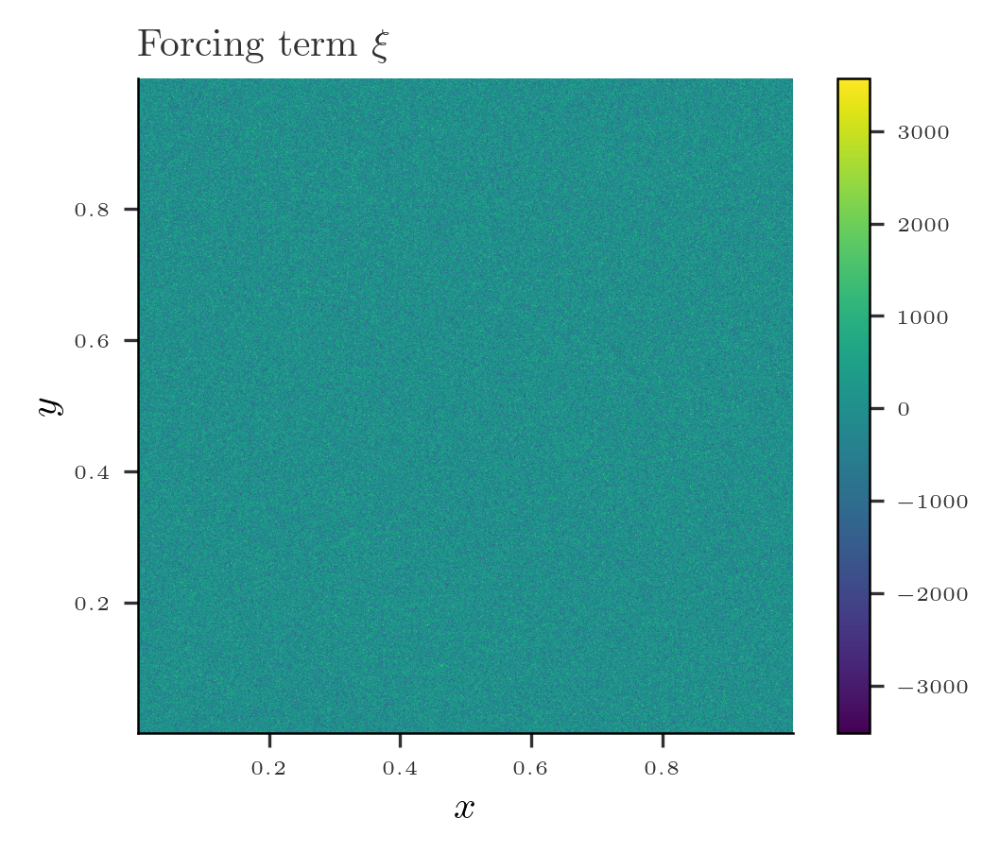

In [16]:
fig = plt.figure(figsize=(width, height))

plt.imshow(f_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Forcing term $\xi$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

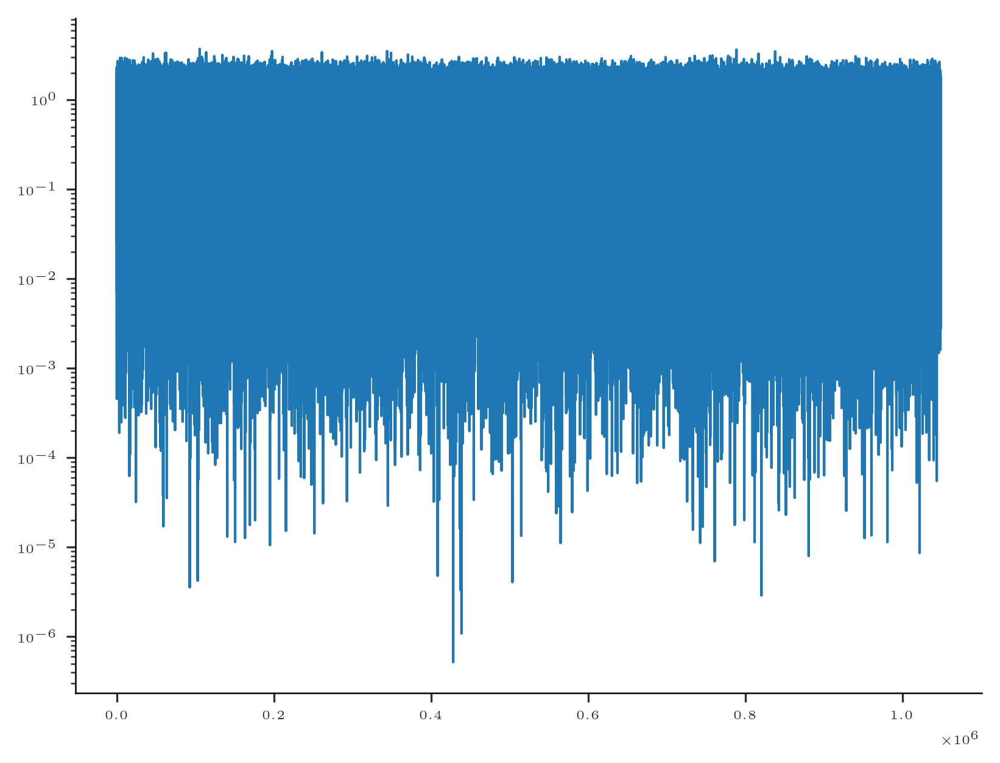

In [17]:
plt.plot(jnp.abs(coef_f.reshape(-1)), label = "f")
plt.yscale("log")
plt.show()

In [18]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])


# 2d grid 
n_points = 2**6
print("Number of points {} ({} measurements)".format(n_points, n_points**2))
x = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:] # remember to not include the points 0 and 1
y = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x, y)

# Use meshgrid to create the grid of pairs
A, B = jnp.meshgrid(x, x, indexing='ij')

# Combine A and B into pairs
interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
print(interior.shape)

Number of points 64 (4096 measurements)
(4096, 2)


In [19]:
# Create the boundary

# Create a boundary
# Boundary points
boundary = jnp.hstack([jnp.zeros(1), x, jnp.zeros(1)])
n_boundary = boundary.shape[0]
print("Number of boundary points: {} ({} total)".format(n_boundary, n_boundary*4))

boundary_points = []
# Creat a discretization of the boundary
for i in [0,1]:
    boundary_points.append(jnp.stack([jnp.zeros(n_boundary) + i, boundary], axis=-1))
for i in [0,1]:
    boundary_points.append(jnp.stack([boundary, jnp.zeros(n_boundary) + i], axis=-1))
    

boundary_points = jnp.concatenate(boundary_points, axis=0)
boundary_condition = jnp.zeros(shape = boundary_points.shape[0])

Number of boundary points: 66 (264 total)


In [20]:
n_eval = 2**8
x_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
y_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
X, Y = jnp.meshgrid(x_eval, y_eval)

interior_eval = create_interior(x_eval, y_eval)

ratio = int(n_coef/n_eval)
u_eval = u_values[::ratio, ::ratio]


In [21]:
n_points

64

In [22]:
jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2)), jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2))/jnp.sqrt(jnp.sum(coef_u**2))

(Array(0.00448595, dtype=float64), Array(0.0069493, dtype=float64))

# RFF embedding $H^{-1/2}$

In [24]:
t = 0.5

In [25]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.84089642, 0.6687403 , 0.56234133, ..., 0.12699187, 0.12598022,
        0.12499237],
       [0.6687403 , 0.59460356, 0.52664039, ..., 0.12696711, 0.12595643,
        0.1249695 ],
       [0.56234133, 0.52664039, 0.48549177, ..., 0.1269259 , 0.12591684,
        0.12493143],
       ...,
       [0.12699187, 0.12696711, 0.1269259 , ..., 0.10679395, 0.10636422,
        0.10593632],
       [0.12598022, 0.12595643, 0.12591684, ..., 0.10636422, 0.10594299,
        0.10552343],
       [0.12499237, 0.1249695 , 0.12493143, ..., 0.10593632, 0.10552343,
        0.10511205]], dtype=float64, weak_type=True)

In [26]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [27]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [28]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [29]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [30]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [31]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82568907, -2.09620933,  2.27295881, ...,  0.21604797,
        -0.64546278, -0.14451213],
       [ 0.81629063,  2.72480206, -1.31913821, ..., -0.12774388,
        -0.3913418 ,  1.85226691],
       [-0.2727935 ,  1.01267931, -0.36649319, ...,  0.30331065,
         1.44356656, -0.79820182],
       ...,
       [ 0.28704336,  0.5165279 ,  0.3182724 , ...,  1.69821396,
         0.89858551,  0.32189685],
       [ 0.70466466, -1.02525413,  0.42576361, ..., -0.39230683,
        -0.99561378, -0.79613631],
       [ 0.72988781, -0.85037963,  2.43209556, ...,  0.08843714,
         2.11649587,  0.1610075 ]], dtype=float64)

In [32]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.873440488691096 [(Array([[ 0.00749371,  0.02167261, -0.00878253, ...,  0.00148239,
         0.05510522, -0.00491452],
       [ 0.01384897,  0.02126219, -0.02428227, ...,  0.004528  ,
         0.065101  , -0.00137221],
       [-0.02668646, -0.00915739,  0.05902875, ..., -0.03275896,
        -0.10225656,  0.00577095],
       ...,
       [ 0.02674956,  0.01125516, -0.0506019 , ...,  0.01944909,
         0.10034413, -0.00477643],
       [-0.01503687, -0.01997752,  0.01678141, ...,  0.00252493,
        -0.07257061, -0.00210749],
       [-0.00365644,  0.00027467,  0.0162407 , ..., -0.02541647,
         0.00696298, -0.00390436]], dtype=float64), Array([-0.01762378, -0.00797679,  0.04844761,  0.10903565,  0.1792666 ,
        0.05542362, -0.13949178,  0.03033446, -0.01870915, -0.14450673,
        0.00677692, -0.00813345,  0.05734422,  0.03576883,  0.02385286,
        0.07104044,  0.09649773,  0.10416638, -0.15506164, -0.00304747,
       -0.02019414, -0.05078658, -0.02139535, -0.03402798, -0.0

In [33]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [34]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [35]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [36]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8734405
Step 0, Training Loss: 0.8734405, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0022938
Step 10000, Training Loss: 0.0022938, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0005492
Step 20000, Training Loss: 0.0005492, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0002695
Step 30000, Training Loss: 0.0002695, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001093
Step 40000, Training Loss: 0.0001093, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000601
Step 50000, Training Loss: 0.0000601, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001146
Step 60000, Training Loss: 0.0001146, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000222
Step 70000, Training Loss: 0.0000222, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000149
Step 80000, Training Loss: 0.0000149, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000098
Step 90000, Training Loss: 0.0000098, Learning Rate: 0.000387


In [37]:
loss

Array(5.88968636e-06, dtype=float64)

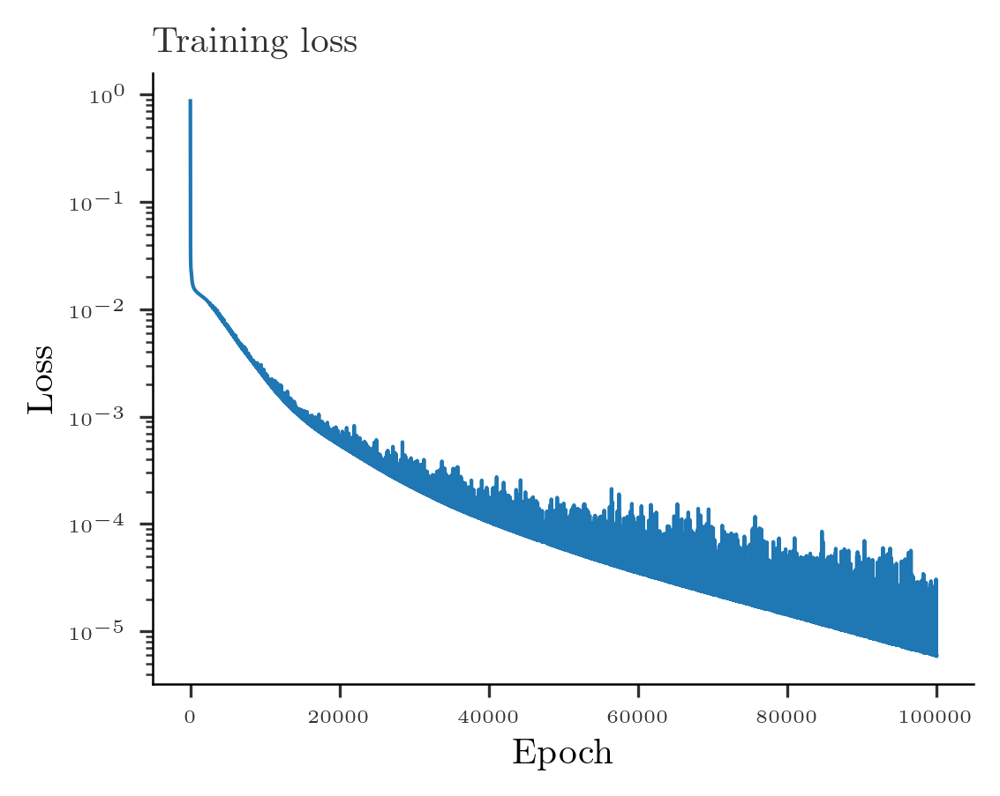

In [38]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [39]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [40]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.30688714, dtype=float64), Array(0.47680733, dtype=float64))


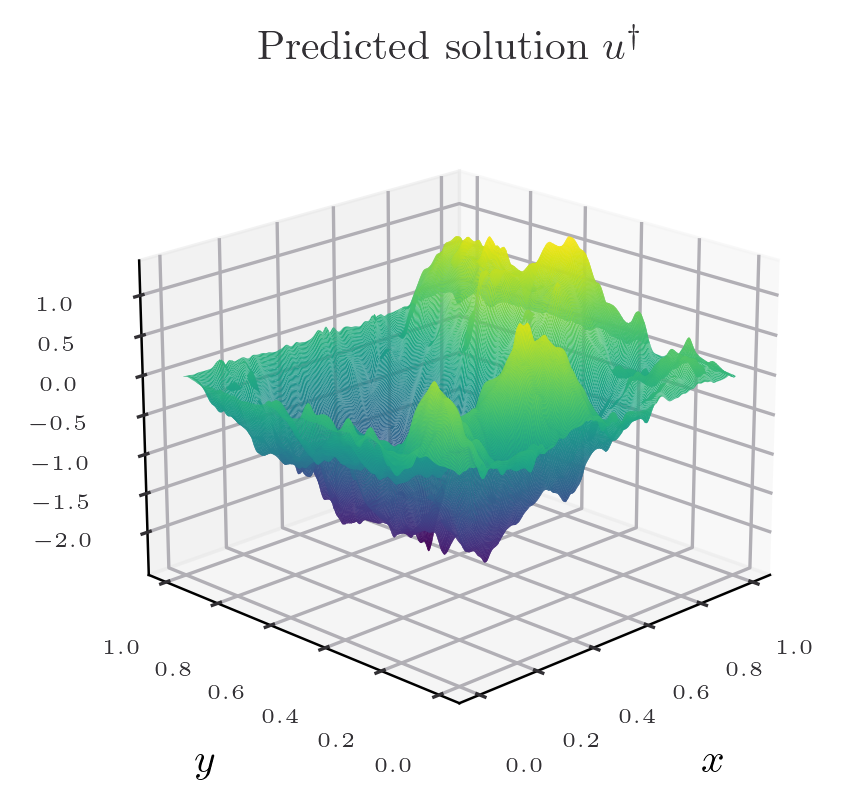

In [41]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

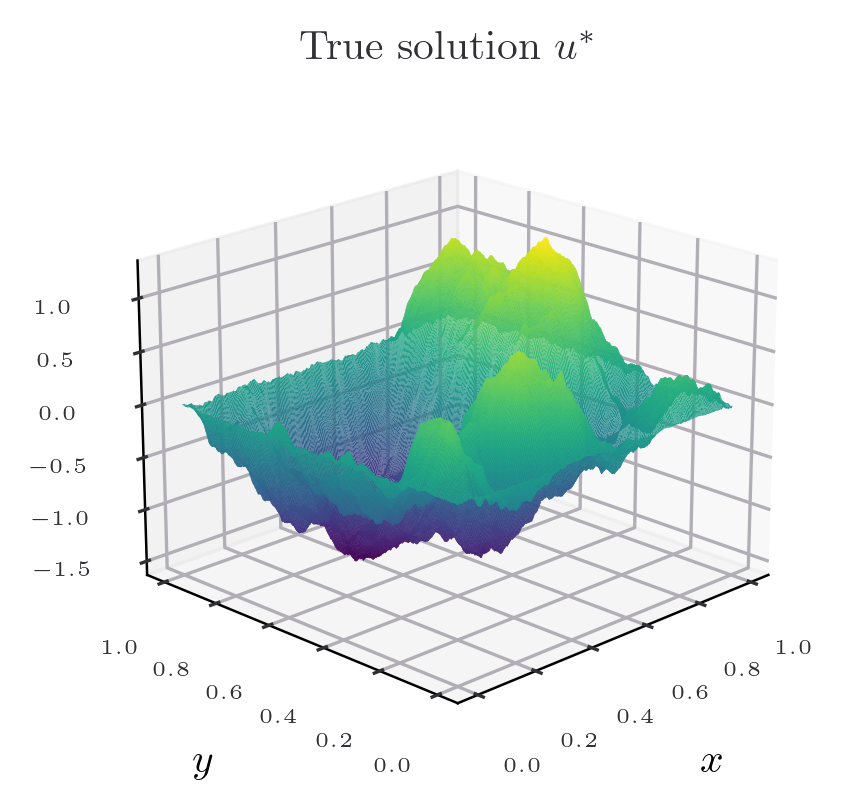

In [42]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

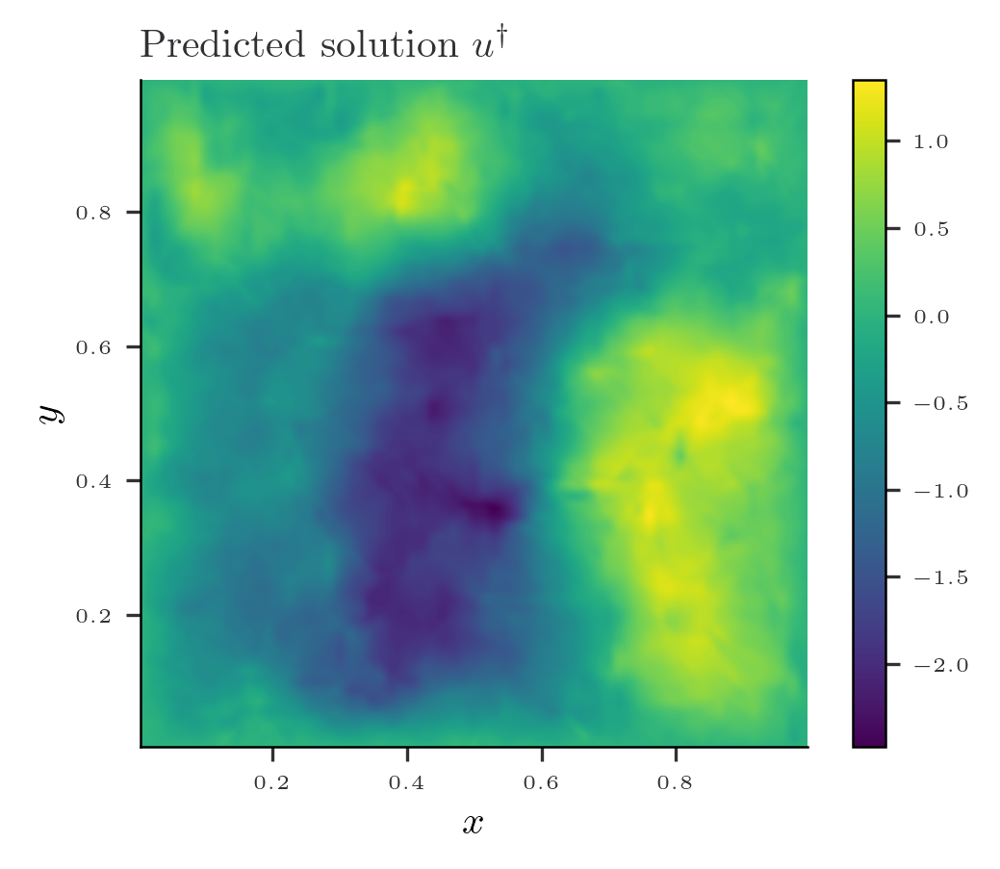

In [43]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

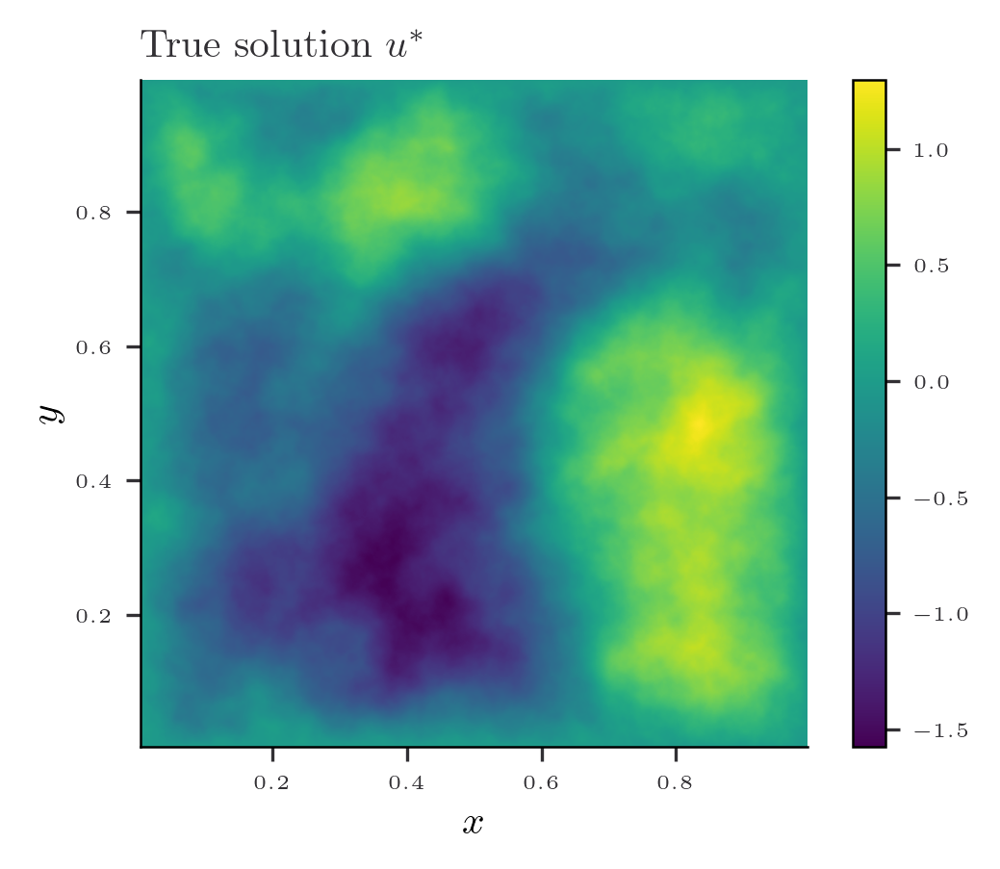

In [44]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

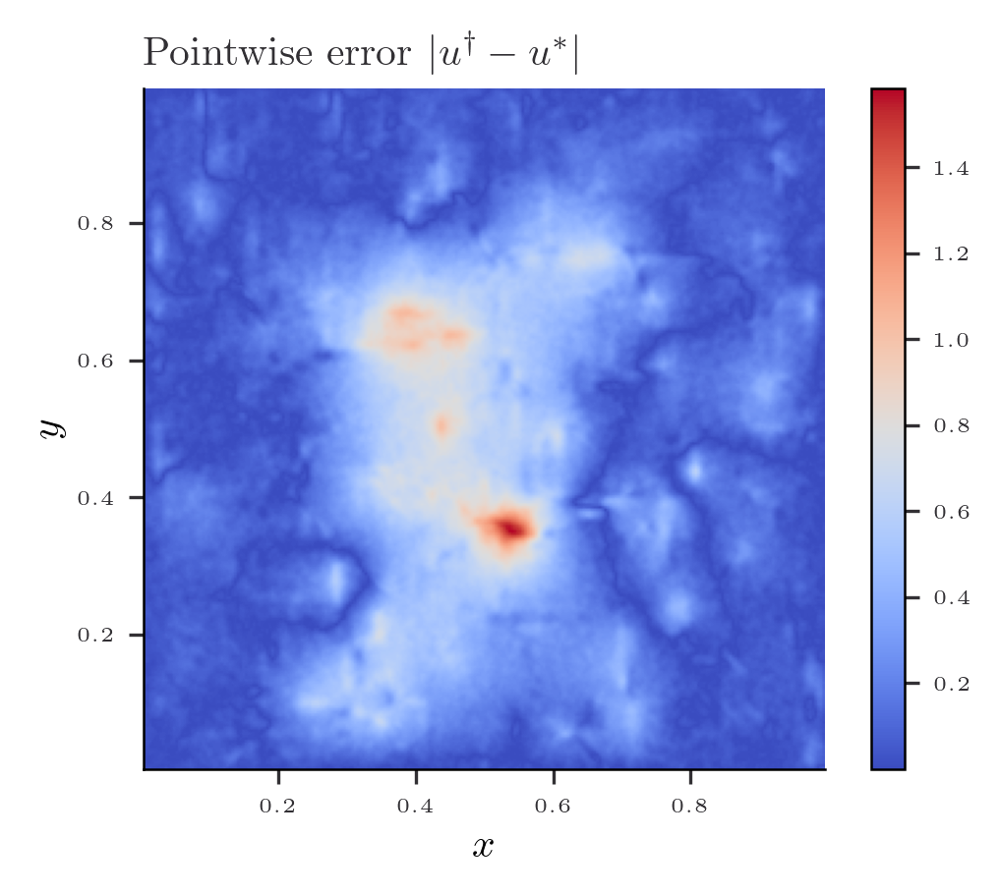

In [45]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-1}$ norm

In [46]:
t = 1.0

In [47]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.70710678, 0.4472136 , 0.31622777, ..., 0.01612693, 0.01587102,
        0.01562309],
       [0.4472136 , 0.35355339, 0.2773501 , ..., 0.01612065, 0.01586502,
        0.01561738],
       [0.31622777, 0.2773501 , 0.23570226, ..., 0.01611018, 0.01585505,
        0.01560786],
       ...,
       [0.01612693, 0.01612065, 0.01611018, ..., 0.01140495, 0.01131335,
        0.0112225 ],
       [0.01587102, 0.01586502, 0.01585505, ..., 0.01131335, 0.01122392,
        0.01113519],
       [0.01562309, 0.01561738, 0.01560786, ..., 0.0112225 , 0.01113519,
        0.01104854]], dtype=float64, weak_type=True)

In [48]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [49]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [50]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [51]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [52]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [53]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82568907, -2.09620933,  2.27295881, ...,  0.21604797,
        -0.64546278, -0.14451213],
       [ 0.81629063,  2.72480206, -1.31913821, ..., -0.12774388,
        -0.3913418 ,  1.85226691],
       [-0.2727935 ,  1.01267931, -0.36649319, ...,  0.30331065,
         1.44356656, -0.79820182],
       ...,
       [ 0.28704336,  0.5165279 ,  0.3182724 , ...,  1.69821396,
         0.89858551,  0.32189685],
       [ 0.70466466, -1.02525413,  0.42576361, ..., -0.39230683,
        -0.99561378, -0.79613631],
       [ 0.72988781, -0.85037963,  2.43209556, ...,  0.08843714,
         2.11649587,  0.1610075 ]], dtype=float64)

In [54]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.847970820554628 [(Array([[ 0.00754069,  0.02151588, -0.00933322, ...,  0.00195871,
         0.05534108, -0.00503092],
       [ 0.01378584,  0.02103451, -0.02451275, ...,  0.00444715,
         0.06511644, -0.001405  ],
       [-0.02660363, -0.0090794 ,  0.05887064, ..., -0.03284935,
        -0.10205601,  0.00582339],
       ...,
       [ 0.02669228,  0.01105077, -0.05056391, ...,  0.01953209,
         0.10029597, -0.00484022],
       [-0.0150823 , -0.02002621,  0.01645879, ...,  0.00257732,
        -0.07298037, -0.00219661],
       [-0.00383763,  0.00024524,  0.01639308, ..., -0.02536969,
         0.00677813, -0.00392446]], dtype=float64), Array([-0.01758795, -0.0080683 ,  0.04870442,  0.10869929,  0.17921556,
        0.05527626, -0.13940243,  0.030482  , -0.01892179, -0.14395955,
        0.00655476, -0.00817155,  0.05797322,  0.03582919,  0.02388903,
        0.07112285,  0.09564483,  0.10452985, -0.15502724, -0.00307641,
       -0.02013739, -0.05020936, -0.02119182, -0.03397298, -0.0

In [55]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [56]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [57]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [58]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8479708
Step 0, Training Loss: 0.8479708, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0002929
Step 10000, Training Loss: 0.0002929, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0002544
Step 20000, Training Loss: 0.0002544, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0001735
Step 30000, Training Loss: 0.0001735, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001417
Step 40000, Training Loss: 0.0001417, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0001282
Step 50000, Training Loss: 0.0001282, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001129
Step 60000, Training Loss: 0.0001129, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000966
Step 70000, Training Loss: 0.0000966, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000824
Step 80000, Training Loss: 0.0000824, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000750
Step 90000, Training Loss: 0.0000750, Learning Rate: 0.000387


In [59]:
loss

Array(6.82510369e-05, dtype=float64)

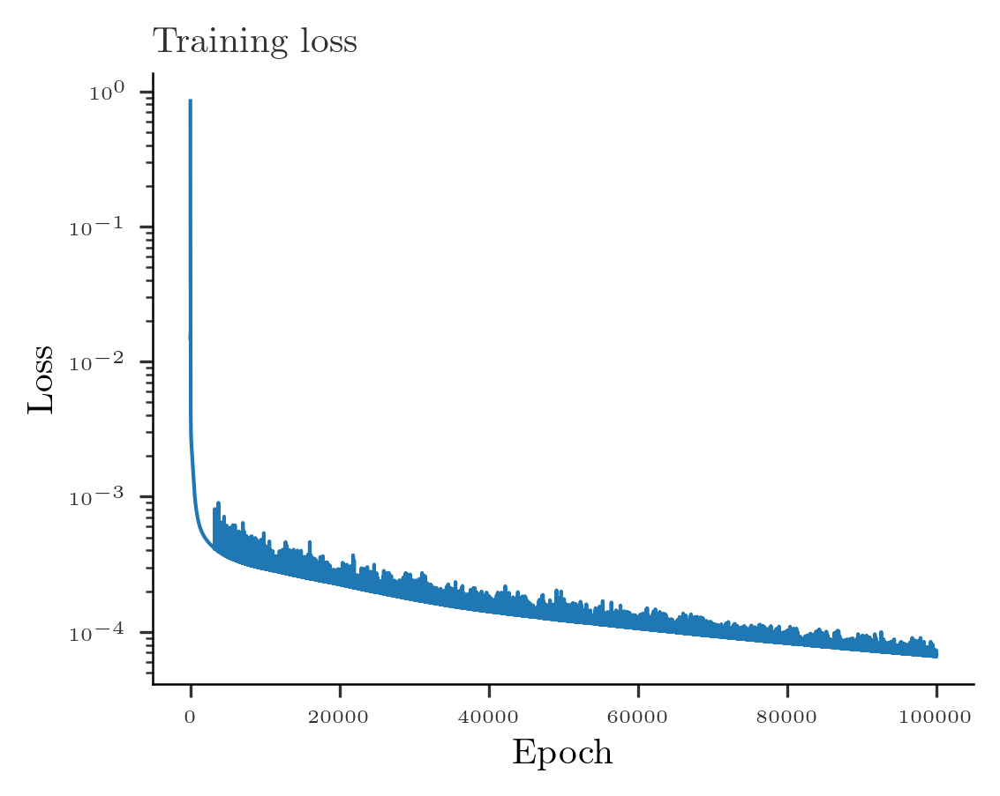

In [60]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [61]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [62]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.04121798, dtype=float64), Array(0.06403994, dtype=float64))


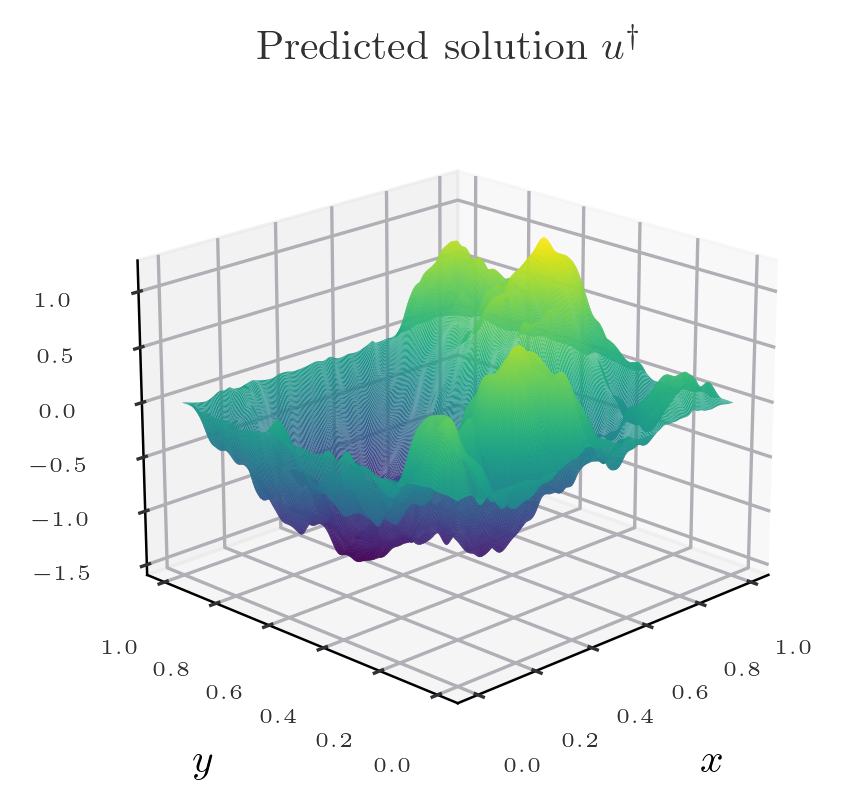

In [63]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

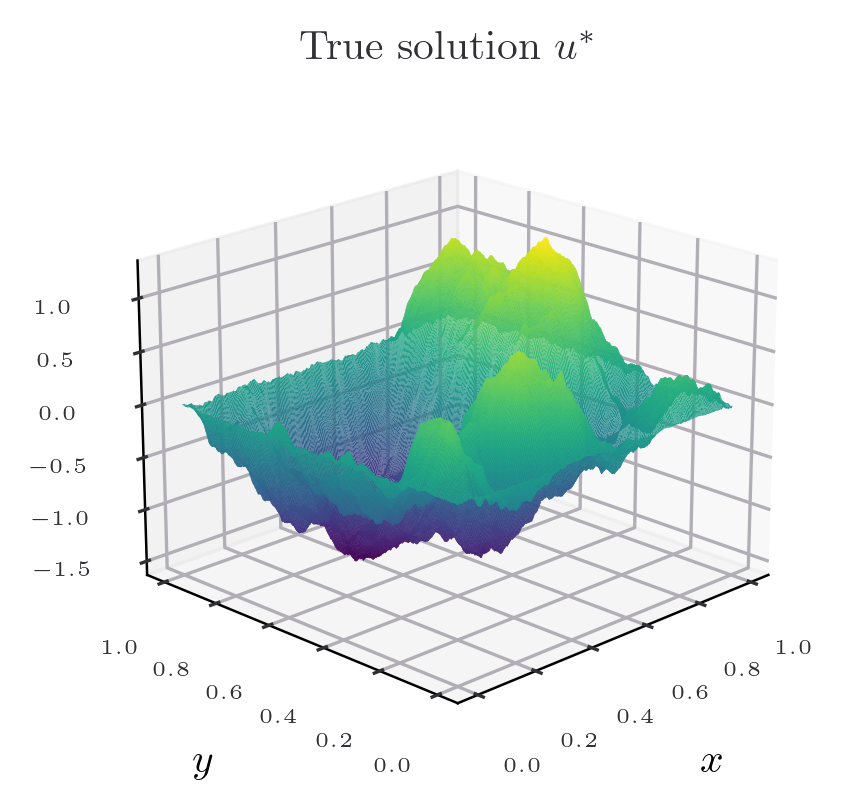

In [64]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

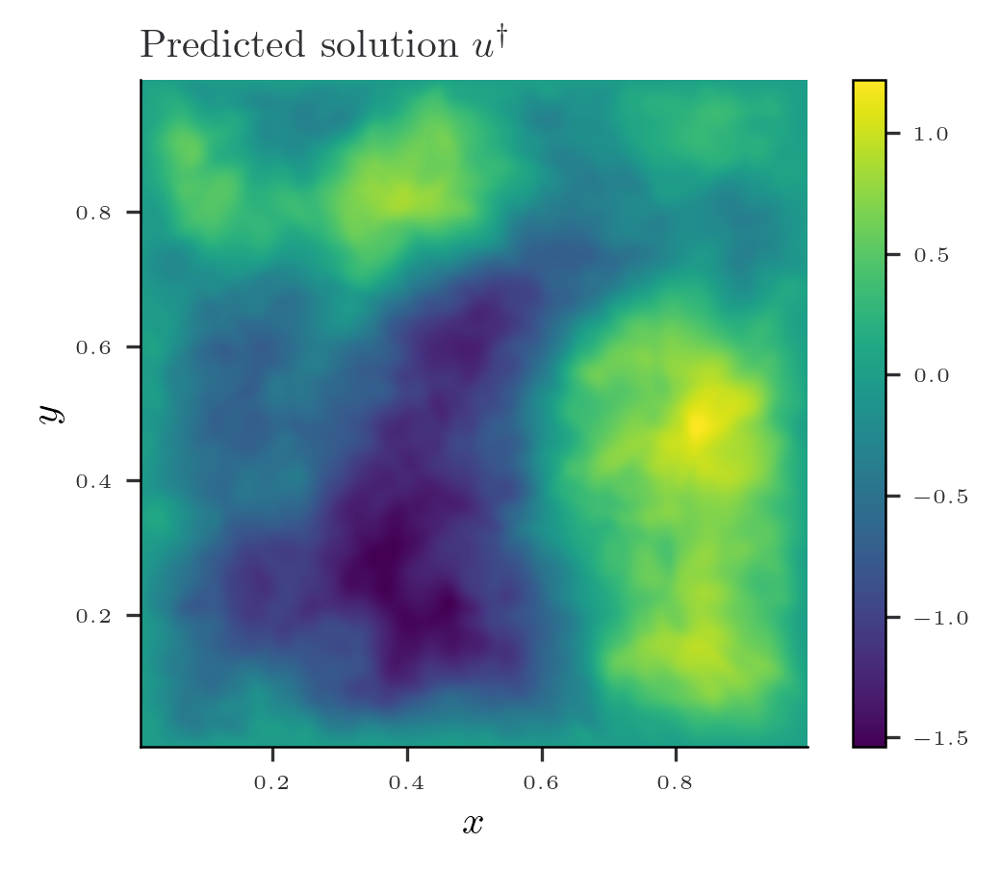

In [65]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

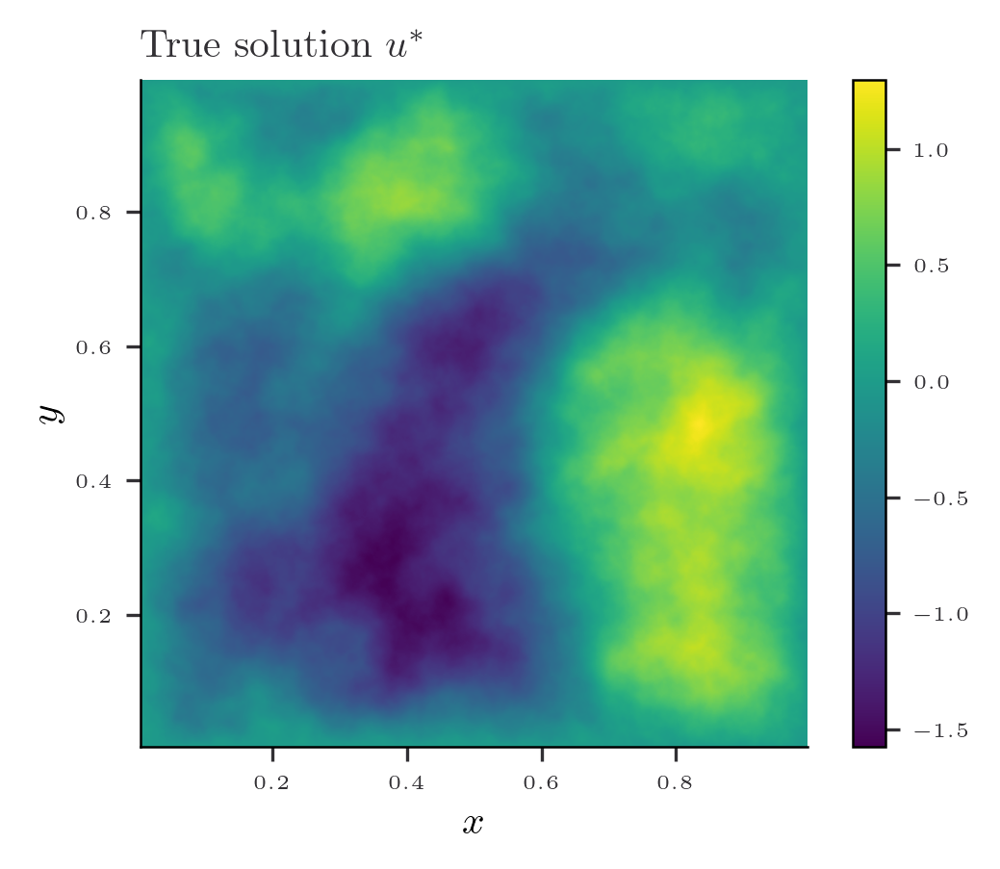

In [66]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

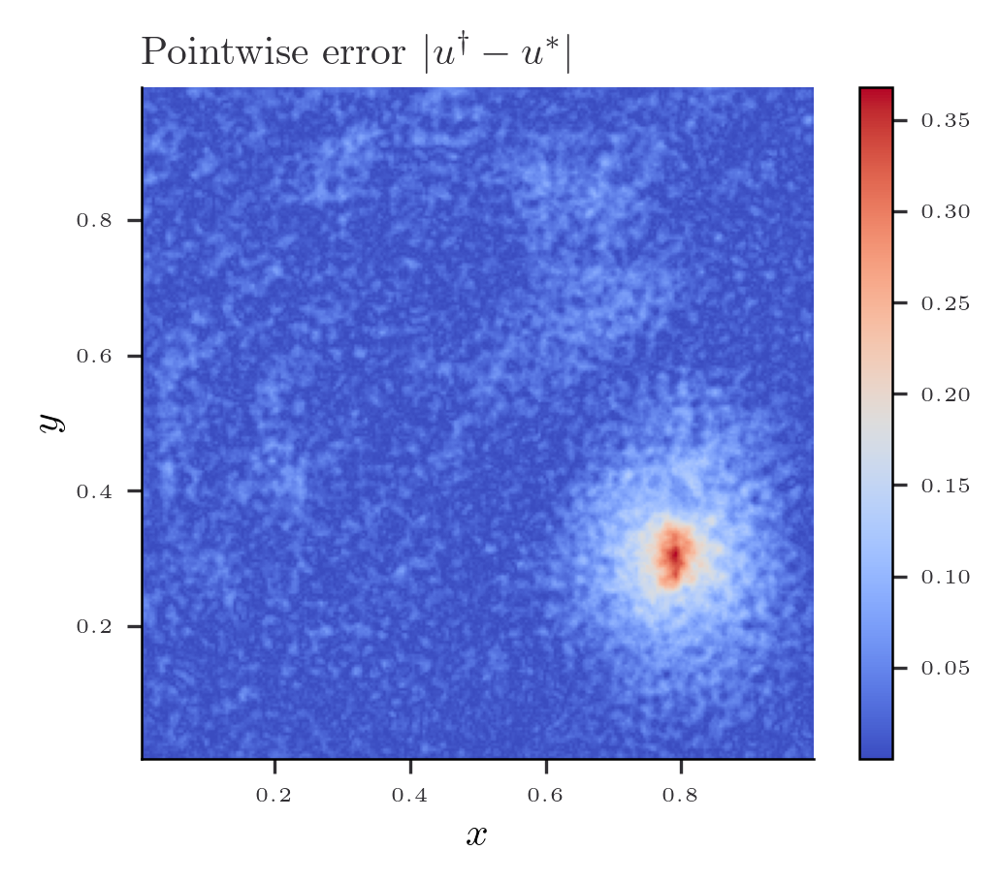

In [67]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $L^2$ loss

In [68]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.0)
decay_nugget

Array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float64, weak_type=True)

In [69]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [70]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [71]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [72]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [73]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [74]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82568907, -2.09620933,  2.27295881, ...,  0.21604797,
        -0.64546278, -0.14451213],
       [ 0.81629063,  2.72480206, -1.31913821, ..., -0.12774388,
        -0.3913418 ,  1.85226691],
       [-0.2727935 ,  1.01267931, -0.36649319, ...,  0.30331065,
         1.44356656, -0.79820182],
       ...,
       [ 0.28704336,  0.5165279 ,  0.3182724 , ...,  1.69821396,
         0.89858551,  0.32189685],
       [ 0.70466466, -1.02525413,  0.42576361, ..., -0.39230683,
        -0.99561378, -0.79613631],
       [ 0.72988781, -0.85037963,  2.43209556, ...,  0.08843714,
         2.11649587,  0.1610075 ]], dtype=float64)

In [75]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

1.5864369134401426 [(Array([[ 0.00724775,  0.02202301, -0.00620295, ..., -0.00167162,
         0.05343526, -0.00394223],
       [ 0.01400542,  0.02273895, -0.02193265, ...,  0.00481907,
         0.06513263, -0.00065418],
       [-0.02739313, -0.00963736,  0.06011426, ..., -0.03243703,
        -0.10291026,  0.00485645],
       ...,
       [ 0.0271694 ,  0.01283226, -0.05110809, ...,  0.01901217,
         0.09949892, -0.00389927],
       [-0.01478399, -0.01965173,  0.02085375, ...,  0.00297386,
        -0.06789469, -0.00077838],
       [-0.00220665,  0.00069101,  0.01553025, ..., -0.02612571,
         0.00838765, -0.00402563]], dtype=float64), Array([-0.0182664 , -0.0080355 ,  0.04602495,  0.11199431,  0.17909376,
        0.05634787, -0.1408932 ,  0.02873583, -0.01664175, -0.14755924,
        0.00750242, -0.00756827,  0.05398317,  0.03649473,  0.02351201,
        0.06997738,  0.10159576,  0.10185908, -0.1554213 , -0.00230288,
       -0.02186095, -0.05549669, -0.02193443, -0.03465662, -0.

In [76]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [77]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [78]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [79]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 1.5864369
Step 0, Training Loss: 1.5864369, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0007672
Step 10000, Training Loss: 0.0007672, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0002349
Step 20000, Training Loss: 0.0002349, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000780
Step 30000, Training Loss: 0.0000780, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000321
Step 40000, Training Loss: 0.0000321, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000193
Step 50000, Training Loss: 0.0000193, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000728
Step 60000, Training Loss: 0.0000728, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000272
Step 70000, Training Loss: 0.0000272, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000730
Step 80000, Training Loss: 0.0000730, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000178
Step 90000, Training Loss: 0.0000178, Learning Rate: 0.000387


In [80]:
loss

Array(3.01559417e-05, dtype=float64)

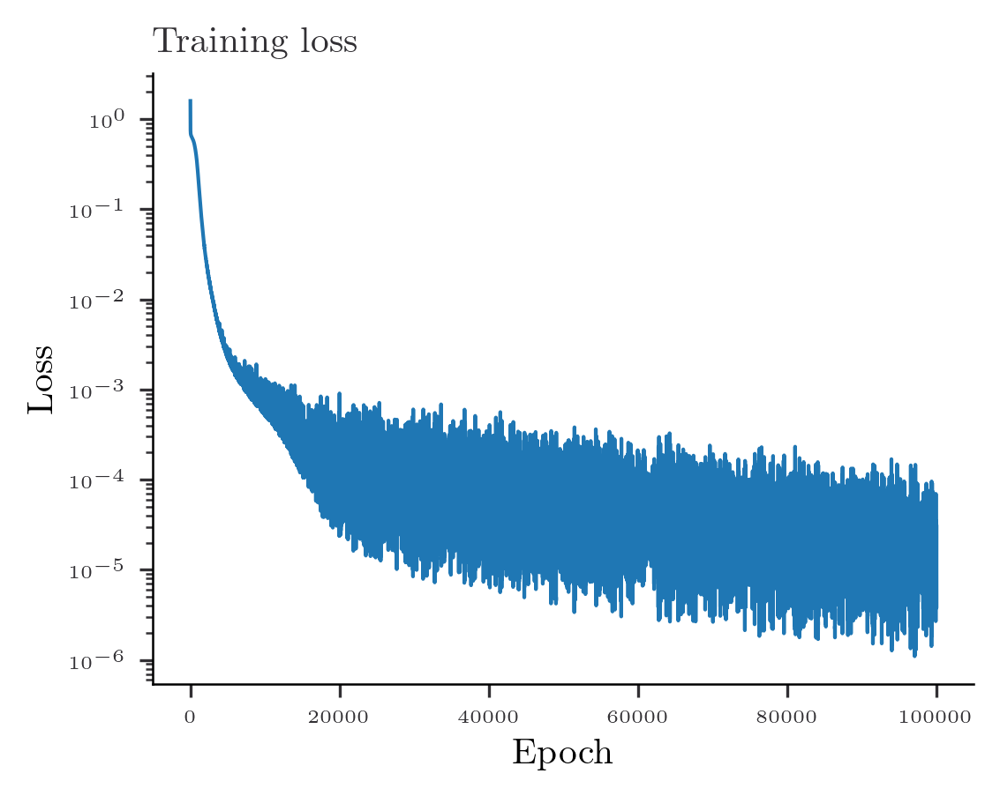

In [81]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [82]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [83]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.20055008, dtype=float64), Array(0.31159256, dtype=float64))


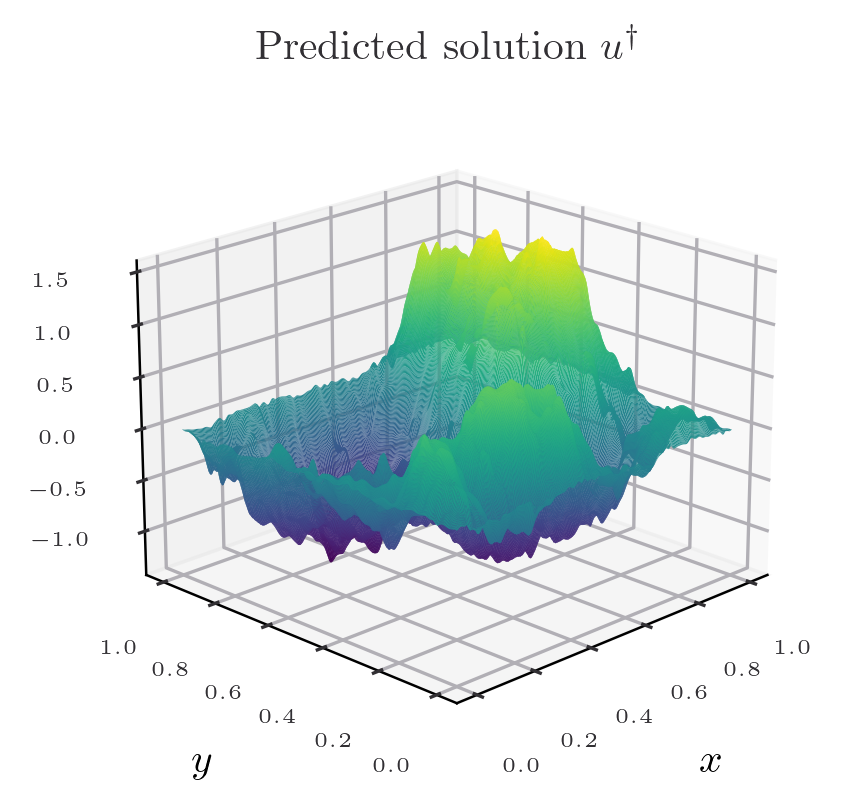

In [84]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

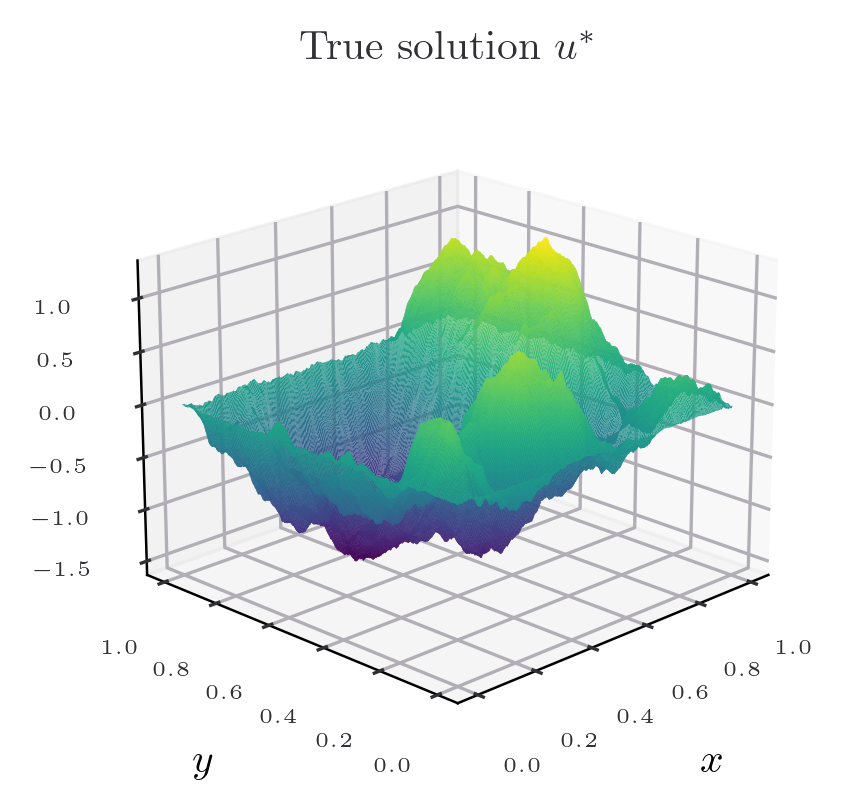

In [85]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

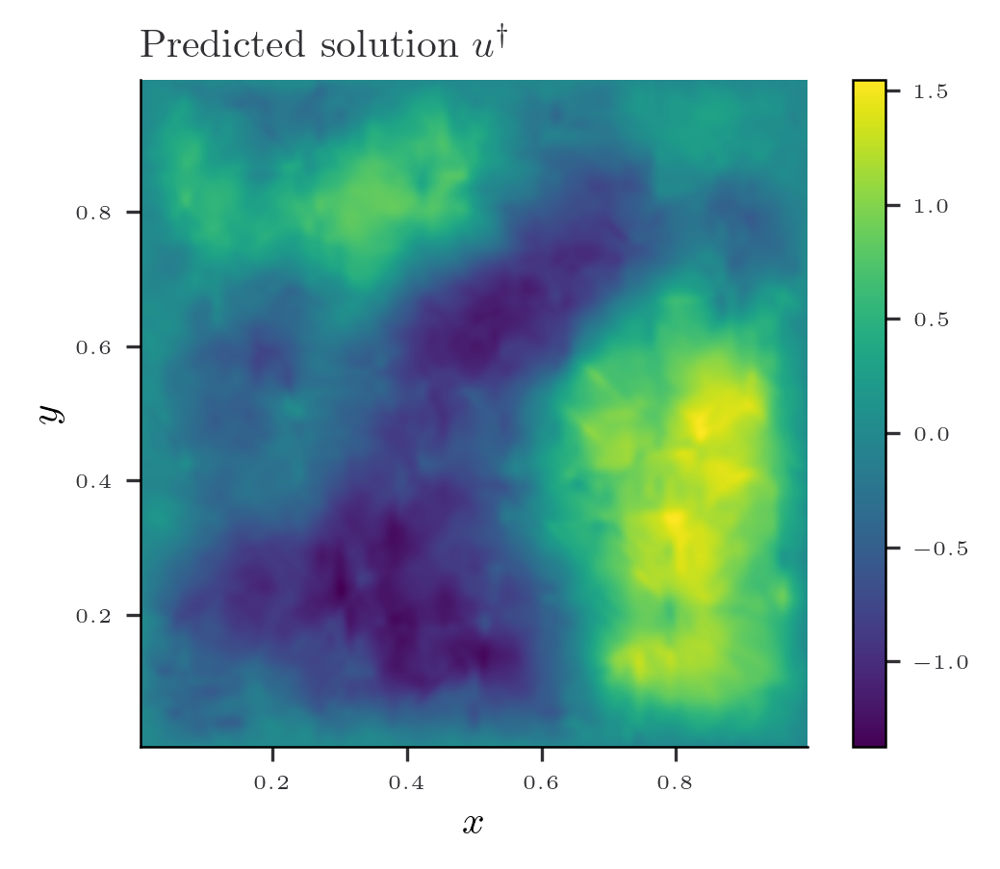

In [86]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

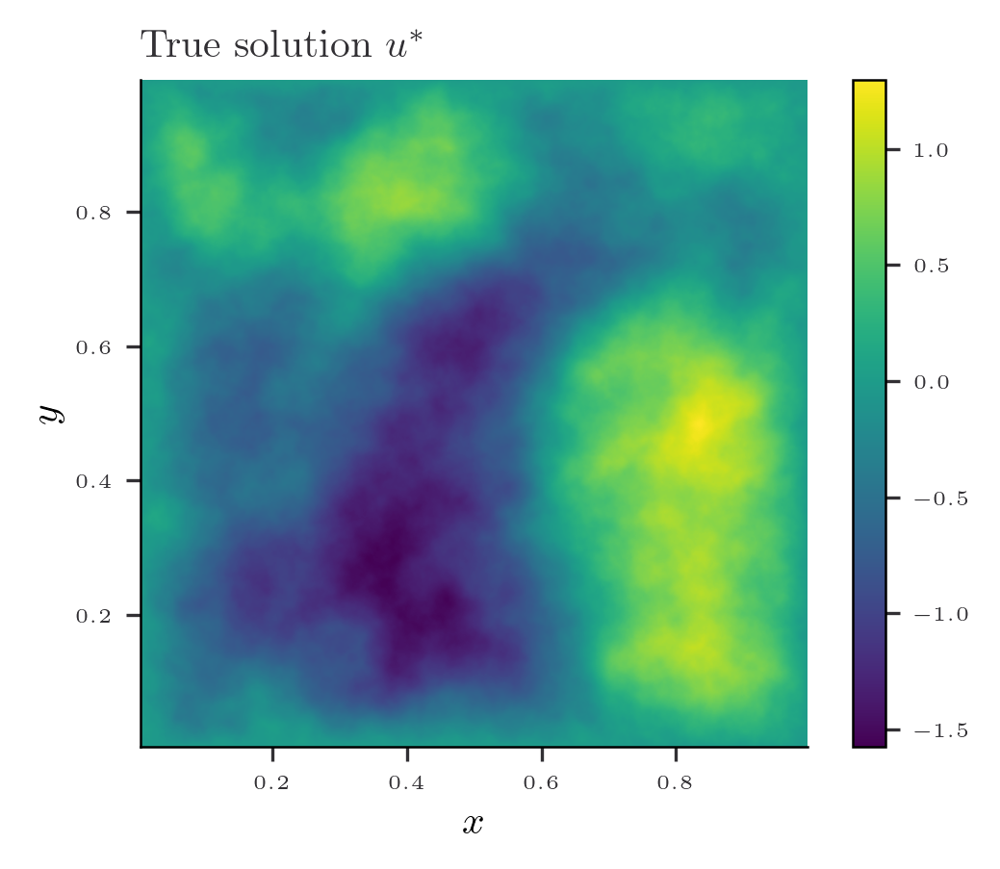

In [87]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

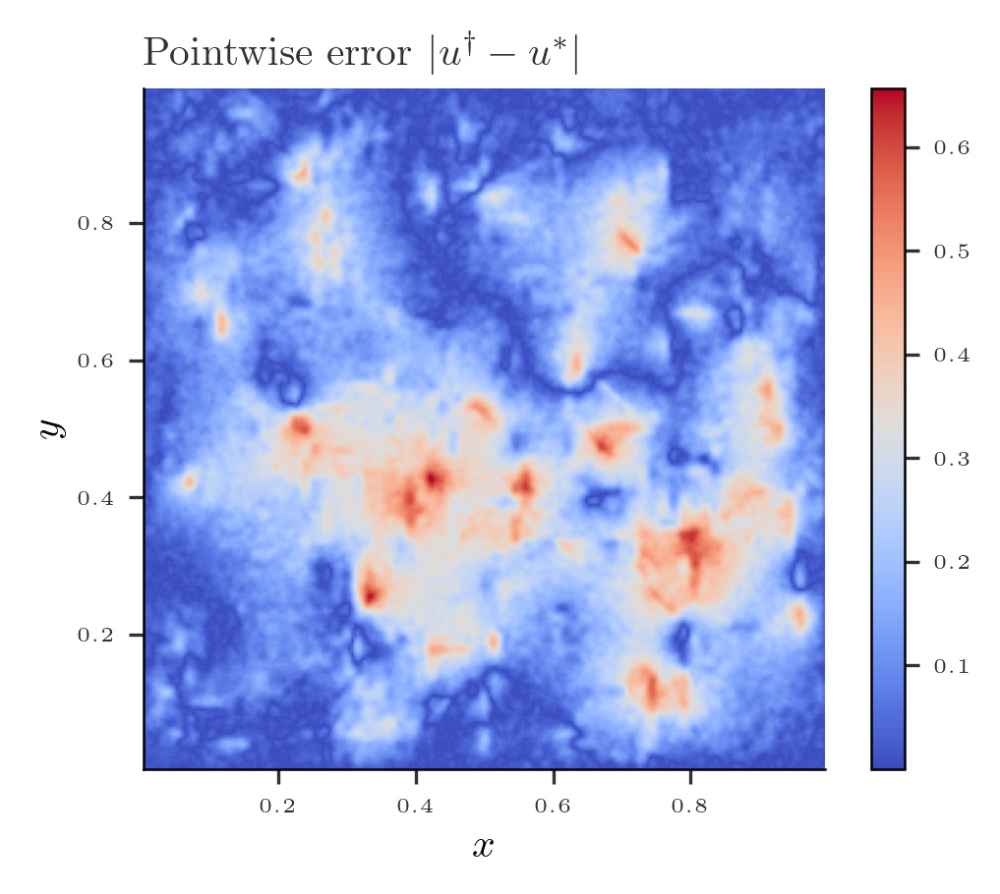

In [88]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-s}$ norm

In [93]:
t = s
t

0.95

In [94]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.71946679, 0.46557457, 0.33496544, ..., 0.01982322, 0.01952426,
        0.0192344 ],
       [0.46557457, 0.37241937, 0.29571742, ..., 0.01981588, 0.01951725,
        0.01922771],
       [0.33496544, 0.29571742, 0.25336438, ..., 0.01980366, 0.0195056 ,
        0.01921659],
       ...,
       [0.01982322, 0.01981588, 0.01980366, ..., 0.01426391, 0.01415505,
        0.01404705],
       [0.01952426, 0.01951725, 0.0195056 , ..., 0.01415505, 0.01404874,
        0.01394321],
       [0.0192344 , 0.01922771, 0.01921659, ..., 0.01404705, 0.01394321,
        0.01384012]], dtype=float64, weak_type=True)

In [95]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [96]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [97]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [98]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [99]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [100]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82568907, -2.09620933,  2.27295881, ...,  0.21604797,
        -0.64546278, -0.14451213],
       [ 0.81629063,  2.72480206, -1.31913821, ..., -0.12774388,
        -0.3913418 ,  1.85226691],
       [-0.2727935 ,  1.01267931, -0.36649319, ...,  0.30331065,
         1.44356656, -0.79820182],
       ...,
       [ 0.28704336,  0.5165279 ,  0.3182724 , ...,  1.69821396,
         0.89858551,  0.32189685],
       [ 0.70466466, -1.02525413,  0.42576361, ..., -0.39230683,
        -0.99561378, -0.79613631],
       [ 0.72988781, -0.85037963,  2.43209556, ...,  0.08843714,
         2.11649587,  0.1610075 ]], dtype=float64)

In [101]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8485846244520361 [(Array([[ 0.00753847,  0.02152446, -0.00930516, ...,  0.00193902,
         0.05533084, -0.00502599],
       [ 0.01378905,  0.02104334, -0.02450562, ...,  0.00445053,
         0.06511543, -0.00140504],
       [-0.02660639, -0.00908305,  0.05887674, ..., -0.03284543,
        -0.10206535,  0.0058228 ],
       ...,
       [ 0.02669444,  0.01105894, -0.05056385, ...,  0.01952818,
         0.10030067, -0.00483918],
       [-0.01508055, -0.02002491,  0.01646586, ...,  0.00257473,
        -0.07296864, -0.00219495],
       [-0.00383107,  0.00024593,  0.0163878 , ..., -0.02536991,
         0.00678503, -0.00392397]], dtype=float64), Array([-0.01758851, -0.00806288,  0.04869631,  0.10870908,  0.17921859,
        0.05528184, -0.13940384,  0.03047757, -0.01891473, -0.14398505,
        0.0065661 , -0.0081712 ,  0.05794475,  0.03582263,  0.02388674,
        0.07112147,  0.09567956,  0.1045121 , -0.15502667, -0.00307747,
       -0.02013741, -0.0502313 , -0.02120071, -0.03397255, -0.

In [102]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [103]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [104]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [105]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8485846
Step 0, Training Loss: 0.8485846, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0004012
Step 10000, Training Loss: 0.0004012, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0002921
Step 20000, Training Loss: 0.0002921, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0002212
Step 30000, Training Loss: 0.0002212, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001784
Step 40000, Training Loss: 0.0001784, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0001555
Step 50000, Training Loss: 0.0001555, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001271
Step 60000, Training Loss: 0.0001271, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0001097
Step 70000, Training Loss: 0.0001097, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000958
Step 80000, Training Loss: 0.0000958, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000835
Step 90000, Training Loss: 0.0000835, Learning Rate: 0.000387


In [106]:
loss

Array(7.4463739e-05, dtype=float64)

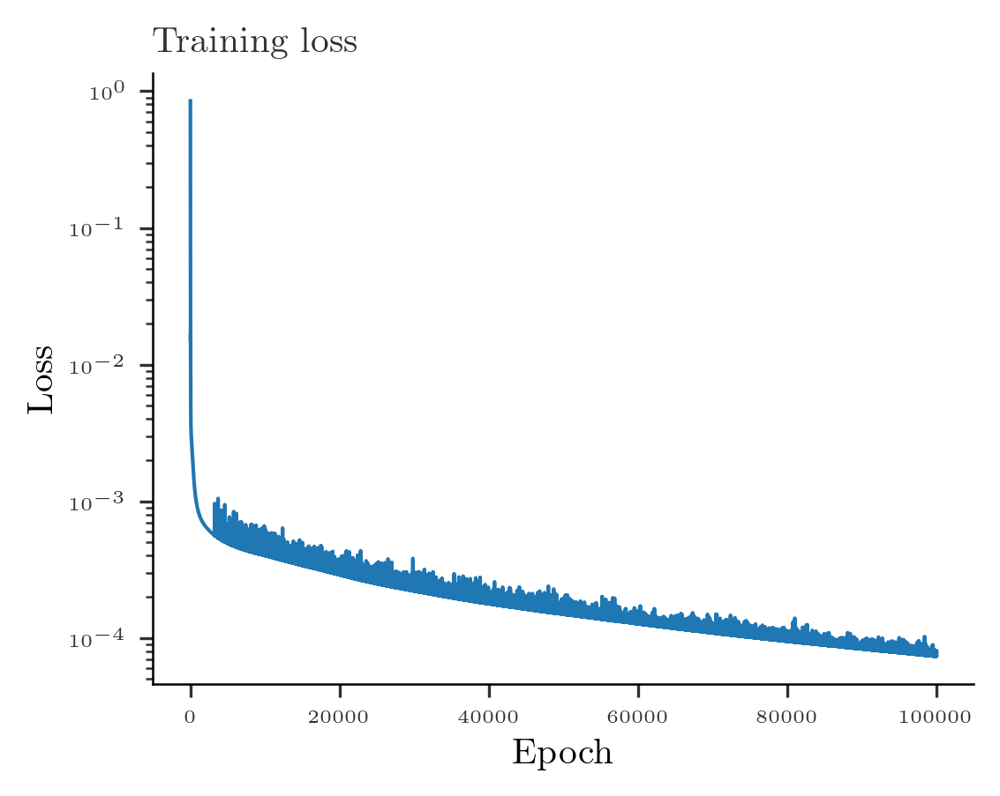

In [107]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [108]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [109]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.05768757, dtype=float64), Array(0.08962857, dtype=float64))


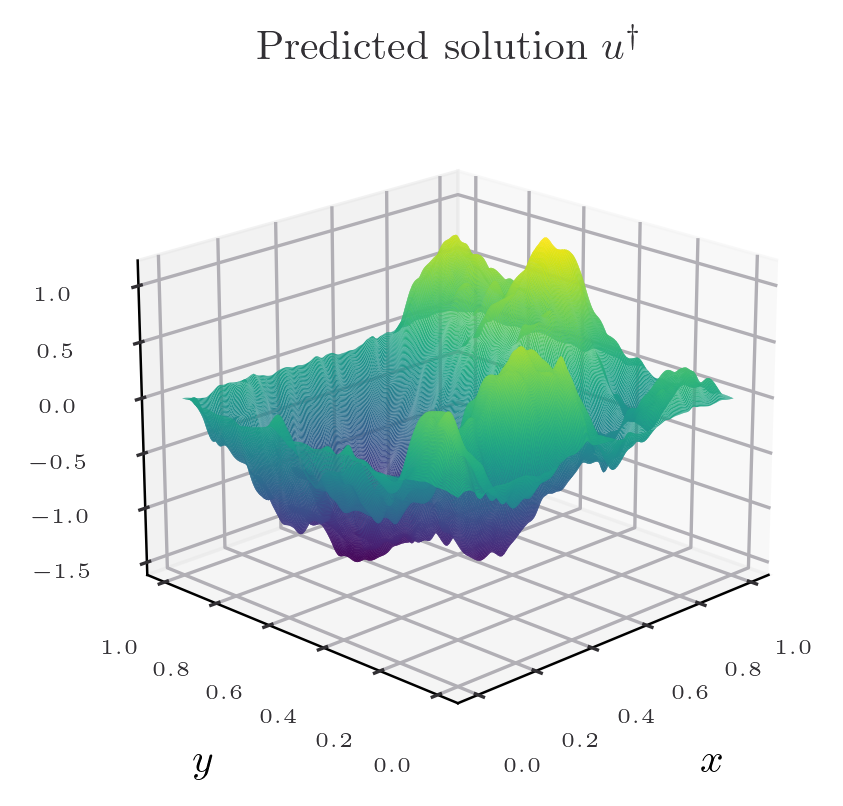

In [110]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

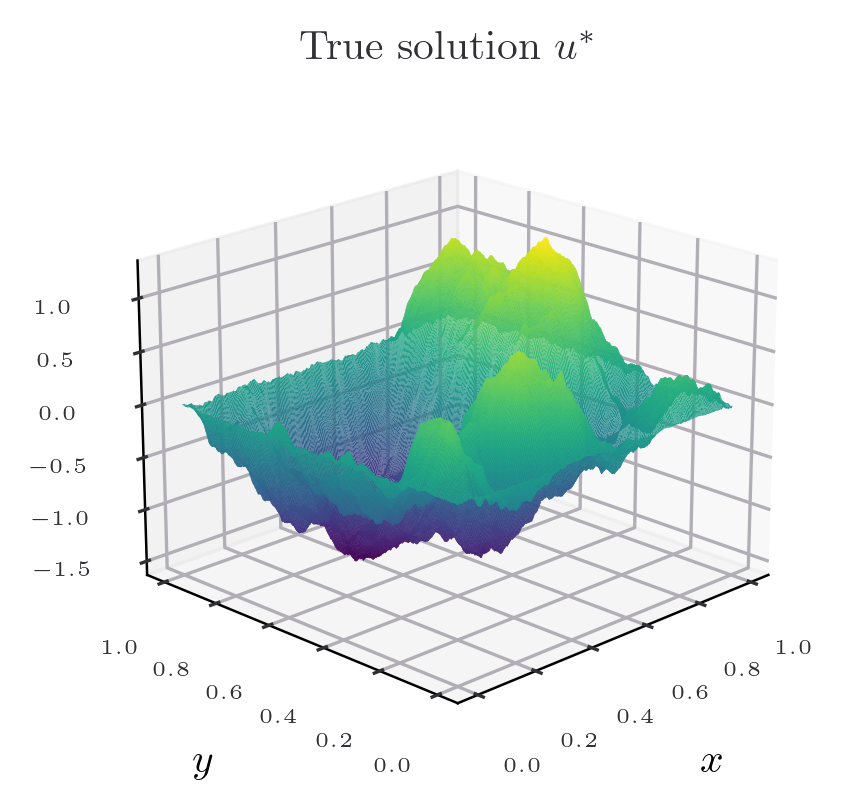

In [111]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

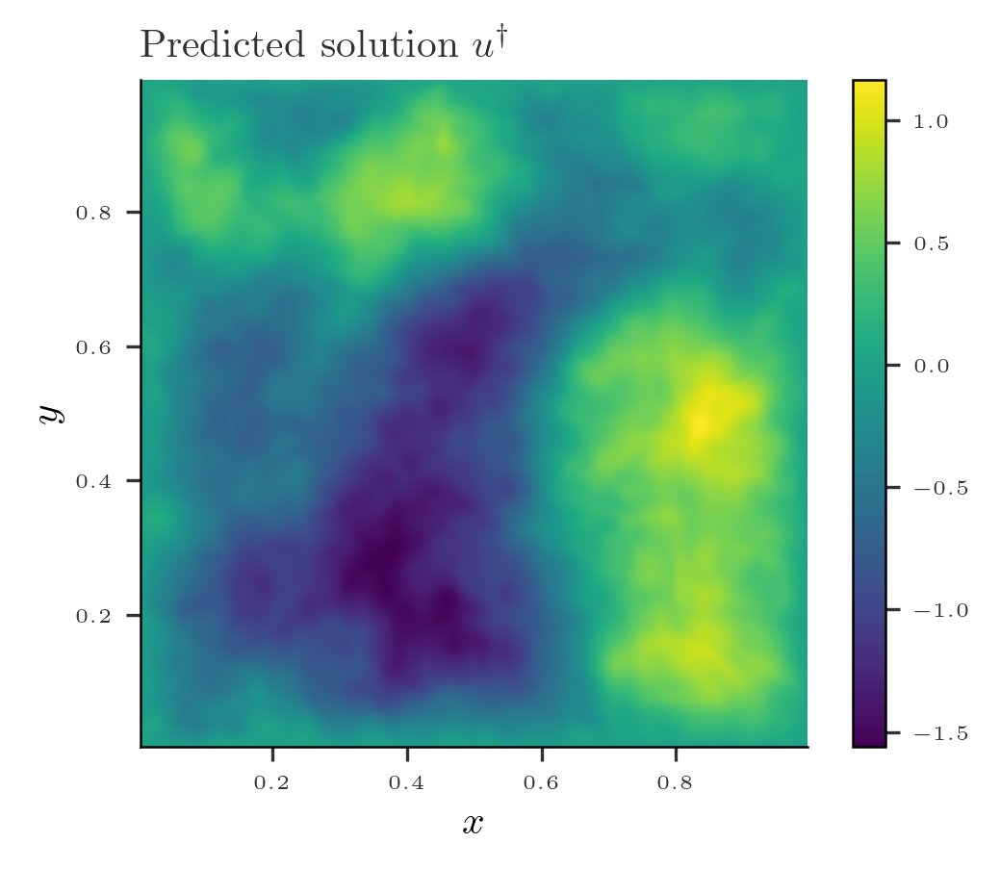

In [112]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

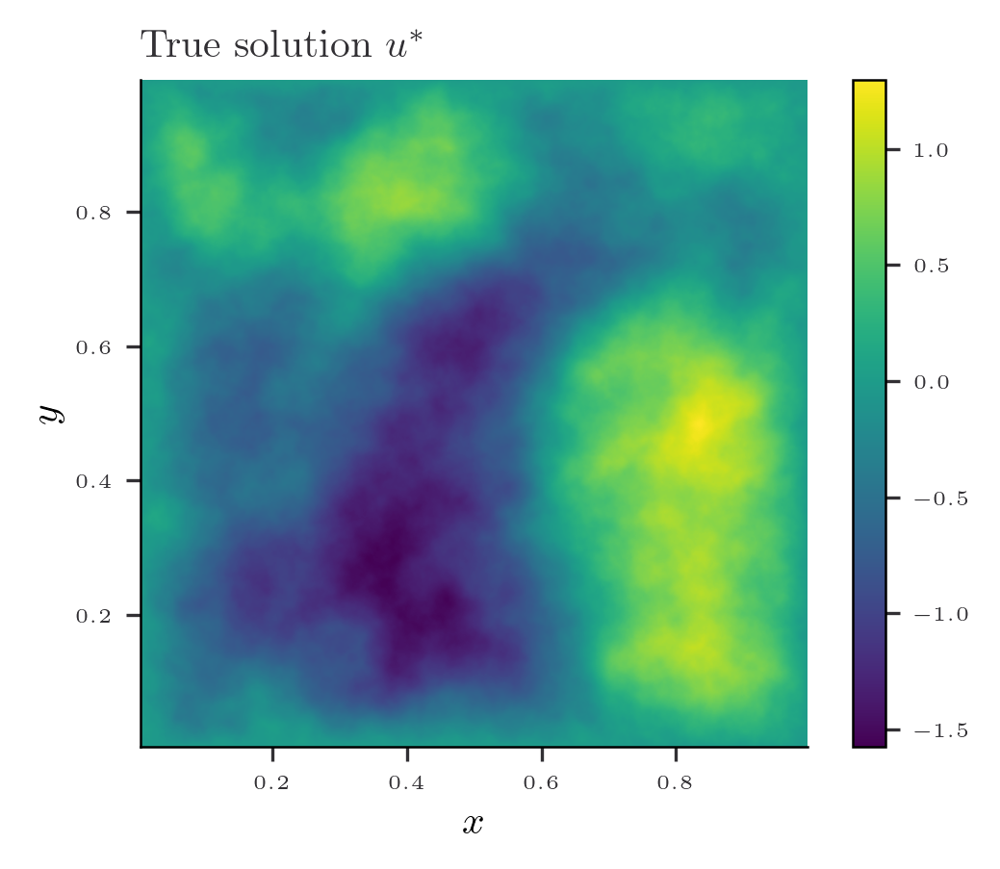

In [113]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

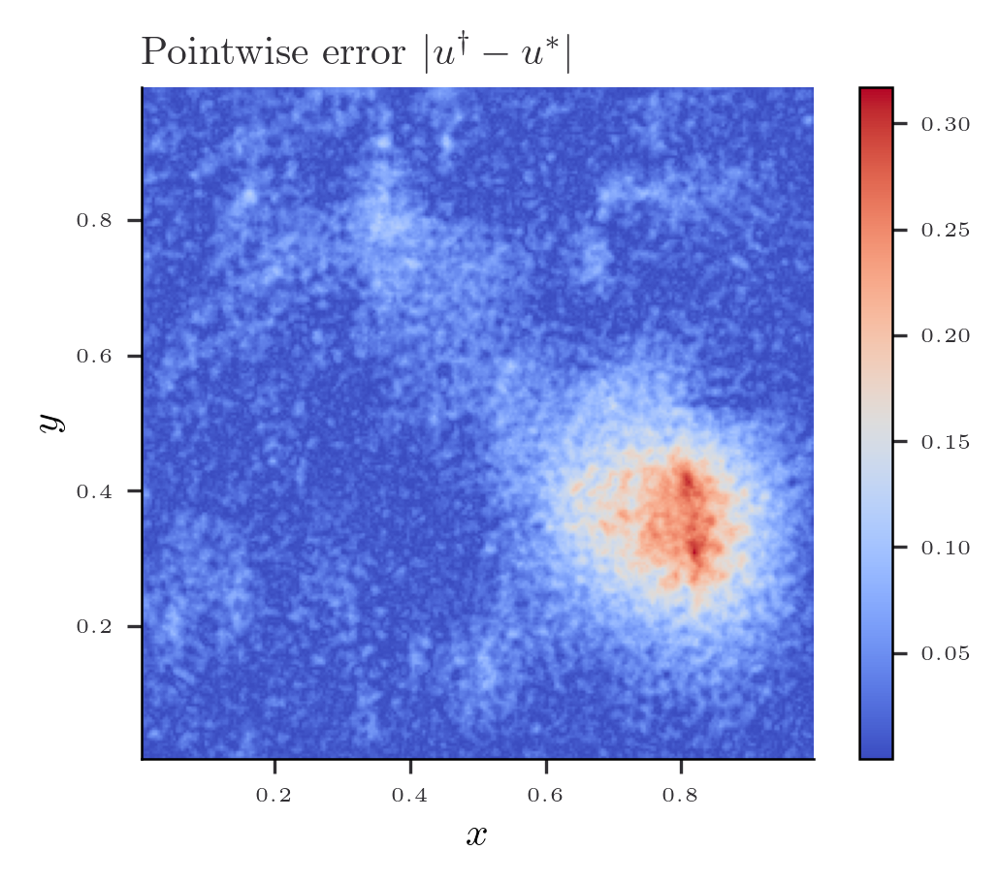

In [114]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-s- \varepsilon}$ norm

In [23]:
t = s + 0.01
t

0.96

In [24]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.71697762, 0.46184303, 0.33113112, ..., 0.01902172, 0.01873185,
        0.01845085],
       [0.46184303, 0.3685673 , 0.29194913, ..., 0.0190146 , 0.01872505,
        0.01844437],
       [0.33113112, 0.29194913, 0.24972913, ..., 0.01900275, 0.01871375,
        0.01843358],
       ...,
       [0.01902172, 0.0190146 , 0.01900275, ..., 0.01363985, 0.01353466,
        0.01343031],
       [0.01873185, 0.01872505, 0.01871375, ..., 0.01353466, 0.01343194,
        0.01332999],
       [0.01845085, 0.01844437, 0.01843358, ..., 0.01343031, 0.01332999,
        0.0132304 ]], dtype=float64, weak_type=True)

In [25]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [26]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [27]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [28]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [29]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [30]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82568907, -2.09620933,  2.27295881, ...,  0.21604797,
        -0.64546278, -0.14451213],
       [ 0.81629063,  2.72480206, -1.31913821, ..., -0.12774388,
        -0.3913418 ,  1.85226691],
       [-0.2727935 ,  1.01267931, -0.36649319, ...,  0.30331065,
         1.44356656, -0.79820182],
       ...,
       [ 0.28704336,  0.5165279 ,  0.3182724 , ...,  1.69821396,
         0.89858551,  0.32189685],
       [ 0.70466466, -1.02525413,  0.42576361, ..., -0.39230683,
        -0.99561378, -0.79613631],
       [ 0.72988781, -0.85037963,  2.43209556, ...,  0.08843714,
         2.11649587,  0.1610075 ]], dtype=float64)

In [31]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8484508678774614 [(Array([[ 0.00753894,  0.02152266, -0.00931107, ...,  0.00194322,
         0.05533301, -0.00502703],
       [ 0.01378837,  0.02104145, -0.02450717, ...,  0.0044498 ,
         0.06511564, -0.00140504],
       [-0.02660579, -0.00908228,  0.05887543, ..., -0.03284627,
        -0.10206337,  0.00582295],
       ...,
       [ 0.02669398,  0.0110572 , -0.05056383, ...,  0.019529  ,
         0.1002997 , -0.00483943],
       [-0.01508093, -0.0200252 ,  0.01646427, ...,  0.00257529,
        -0.0729712 , -0.00219533],
       [-0.00383248,  0.00024578,  0.01638896, ..., -0.02536984,
         0.00678355, -0.00392408]], dtype=float64), Array([-0.01758838, -0.00806402,  0.04869807,  0.10870693,  0.17921795,
        0.05528064, -0.13940352,  0.03047854, -0.01891626, -0.14397965,
        0.00656371, -0.00817129,  0.05795079,  0.03582398,  0.02388721,
        0.07112179,  0.09567213,  0.10451584, -0.15502675, -0.00307727,
       -0.02013738, -0.0502266 , -0.02119882, -0.0339726 , -0.

In [32]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [33]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [34]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [35]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8484509
Step 0, Training Loss: 0.8484509, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0004962
Step 10000, Training Loss: 0.0004962, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0002779
Step 20000, Training Loss: 0.0002779, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0002136
Step 30000, Training Loss: 0.0002136, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001681
Step 40000, Training Loss: 0.0001681, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0001437
Step 50000, Training Loss: 0.0001437, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001239
Step 60000, Training Loss: 0.0001239, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0001071
Step 70000, Training Loss: 0.0001071, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0001044
Step 80000, Training Loss: 0.0001044, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000827
Step 90000, Training Loss: 0.0000827, Learning Rate: 0.000387


In [36]:
loss

Array(7.27662388e-05, dtype=float64)

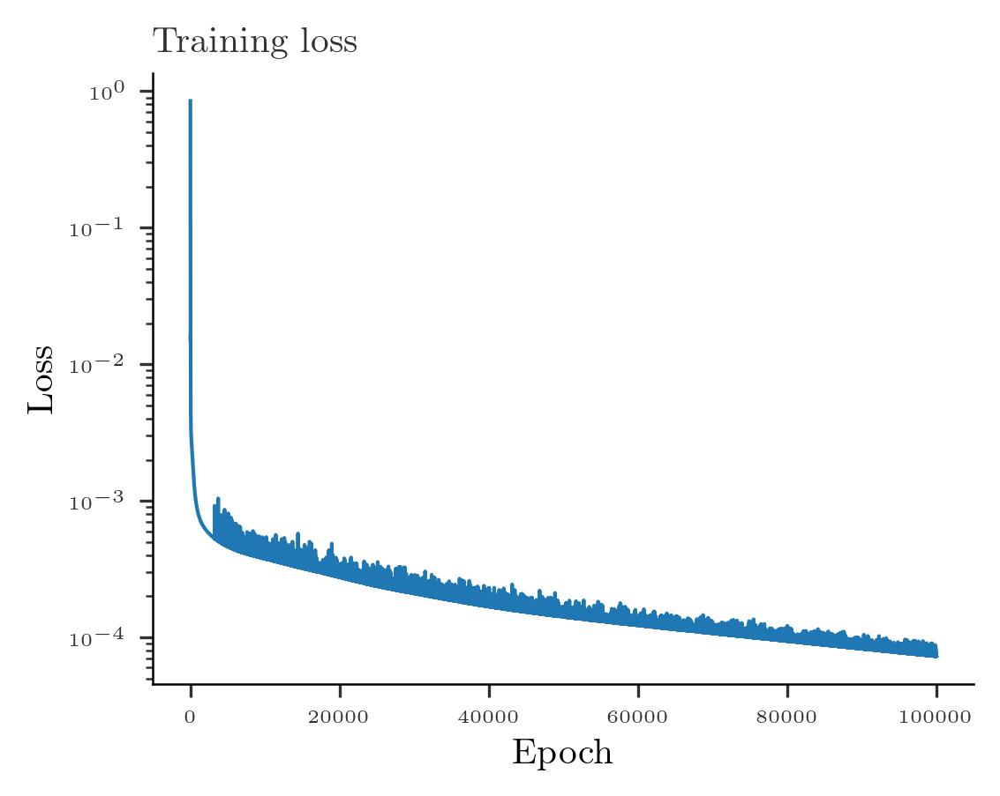

In [37]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [38]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [39]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.03017004, dtype=float64), Array(0.04687487, dtype=float64))


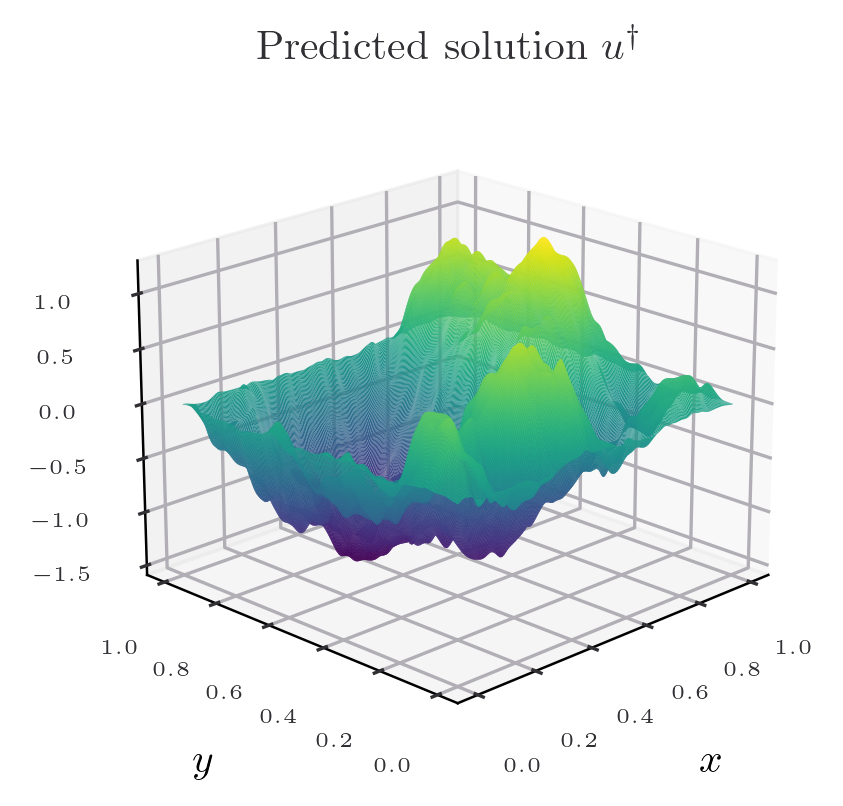

In [40]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

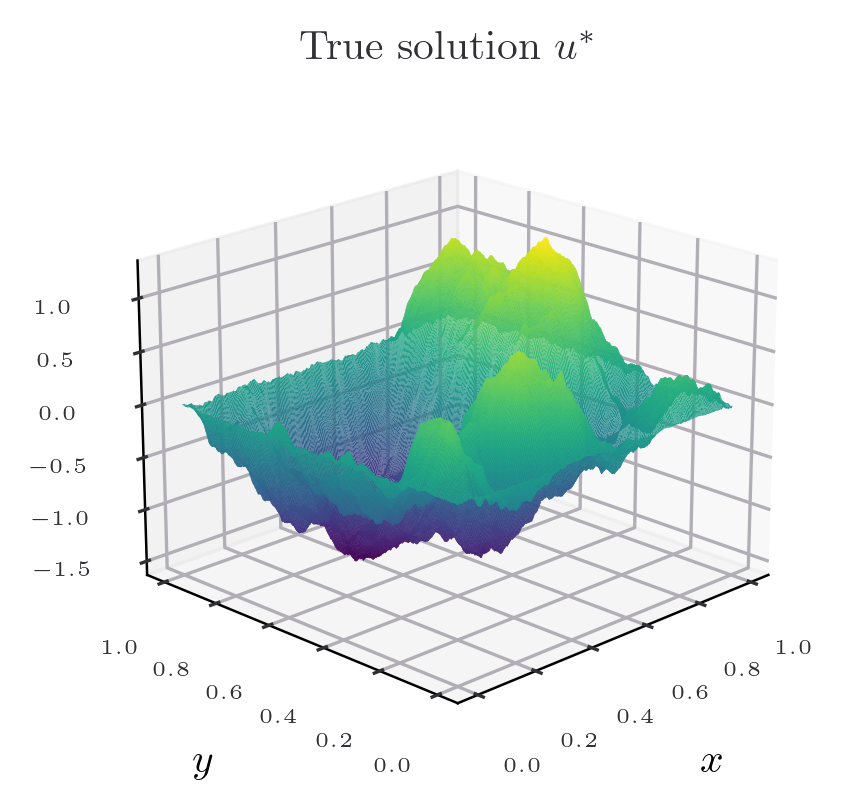

In [41]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

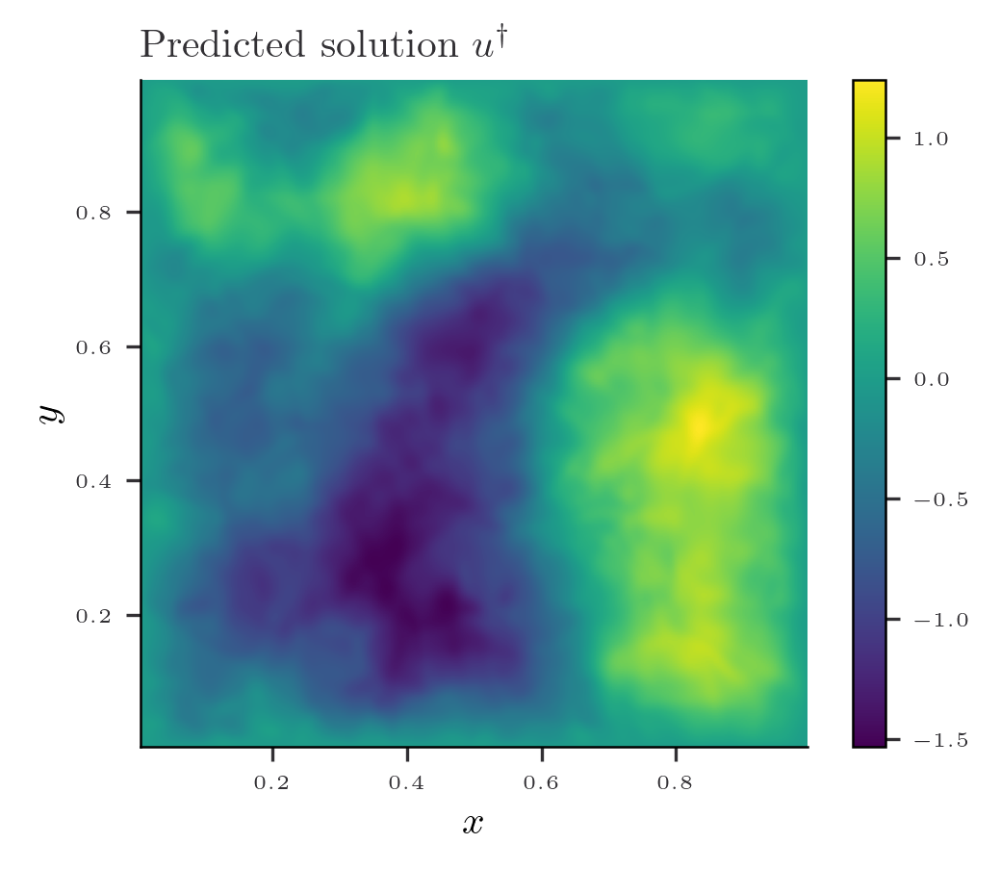

In [42]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

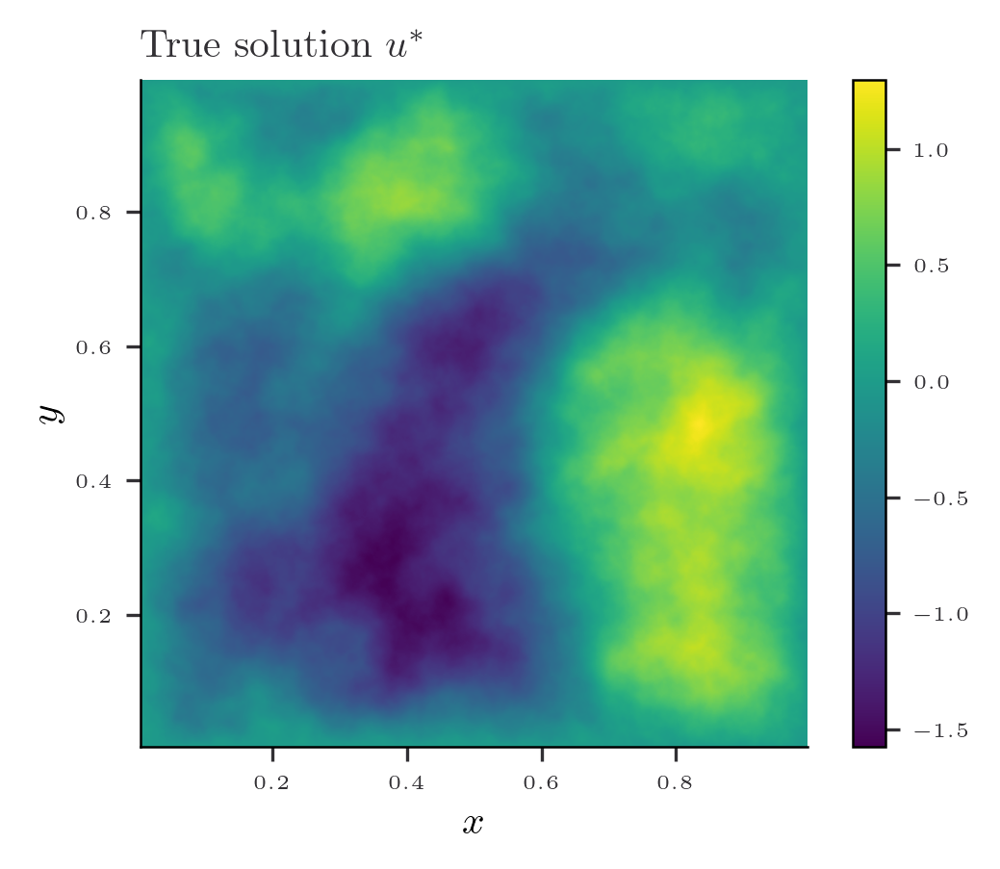

In [43]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

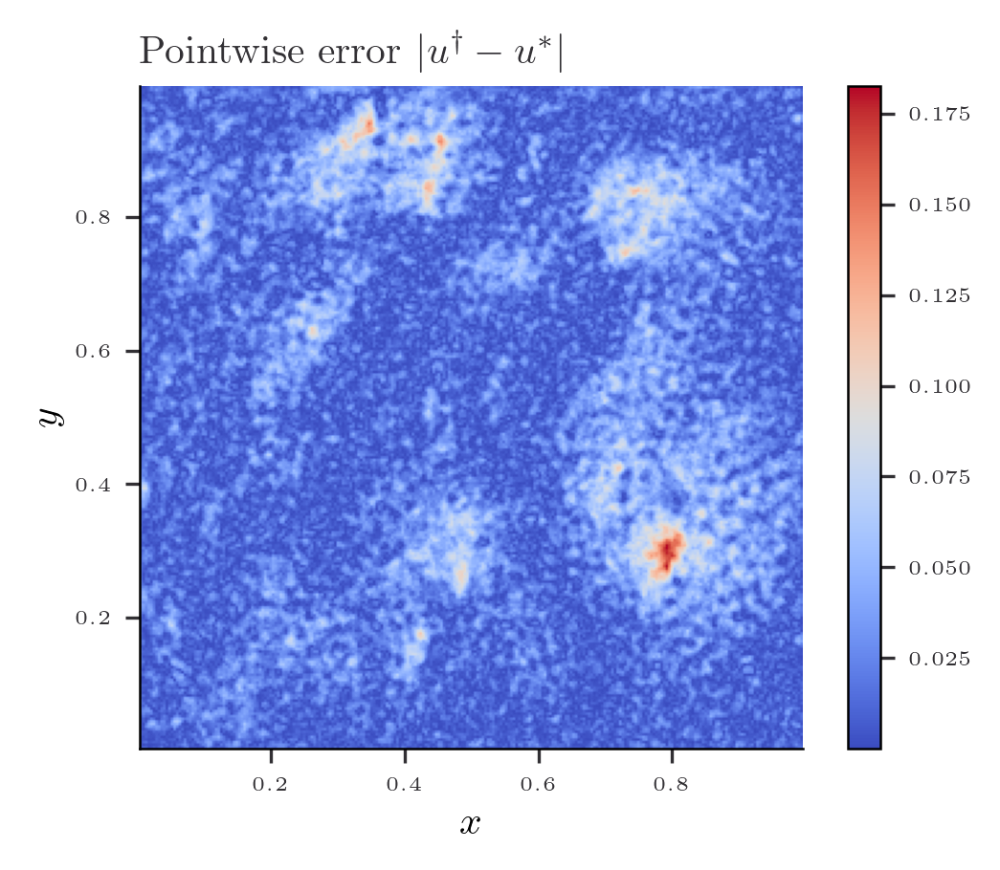

In [44]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()